**Problem Statement**

Researchers face challenges in efficiently extracting relevant information from extensive academic literature and multi-modal data, including figures, tables, and supplementary materials. Traditional RAG systems often fall short in delivering accurate and contextually appropriate responses to complex or speculative research queries. Without advanced techniques such as multi-modal processing, reranking, and query expansion, AI solutions risk providing incomplete or irrelevant results. An advanced AI research assistant that utilizes these enhanced RAG techniques can help improve research efficiency, insight retrieval, and user satisfaction.

**Business Use Case**

A publishing platform offers an AI-powered research assistant to enhance the experience of users exploring scientific literature. The assistant helps researchers query vast databases of articles, images, and tables using advanced RAG techniques. It uses multi-modal RAG to interpret both text and visuals, hypothetical questions to explore complex concepts, and reranking to prioritize the most relevant information. This could also allow users to quickly identify supporting or contradictory evidence across studies, enabling faster literature review and more data-driven discoveries for academic and professional researchers alike.

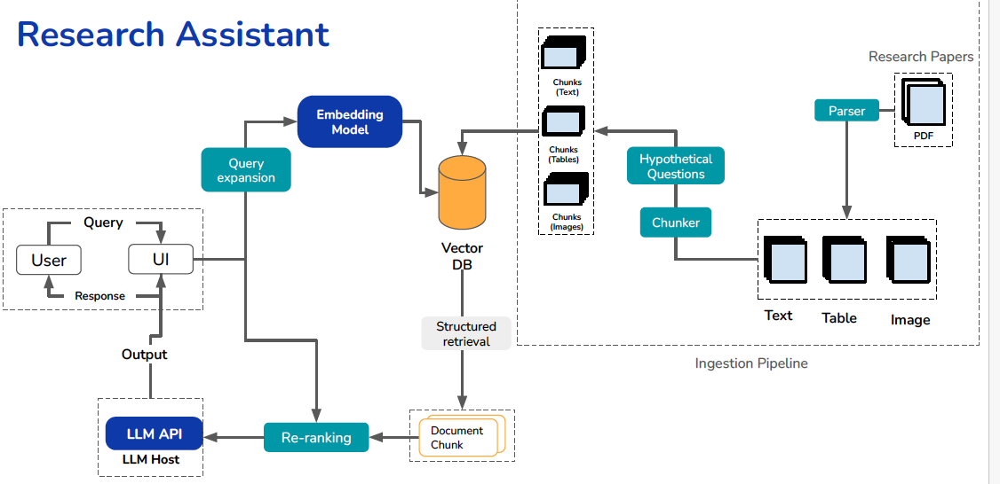

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/GL-GenAI/Week14-AdvancedRag/ResearchAssistant')
os.listdir()

['image_papers.zip',
 'requirements_W14-original.txt',
 'Week_14_Multi_Modal_RAG_Research_Assistant_03_17_25.ipynb',
 'requirements_W14.txt',
 'config2_emb_tested.json',
 'config_GANLP.json',
 'image_papers',
 'images_folder',
 'reports_db',
 'research_db',
 'SM-Week_14_Multi_Modal_RAG_Research_Assistant_03_17_25.ipynb']

In [ ]:
%%writefile requirements_W14.txt
openai
langchain-community
langchain-huggingface
langchain-experimental
langchain-openai
langchain_chroma
sentence-transformers
python-dotenv
lark
llama-index-core
llama-parse
llama-index-readers-file
llama-index-llms-langchain

numpy
transformers

Overwriting requirements_W14.txt


In [ ]:
%%writefile config_GANLP.json
{
"API_KEY": "",
"OPENAI_API_BASE": ""
}

Overwriting config_GANLP.json


In [ ]:
%%writefile config2_emb_tested.json
{"EMB_MODEL_KEY": "",
 "EMB_DEPLOYMENT": "",
 "LLAMA_KEY": ",
 "claude_api": ""
}

Overwriting config2_emb_tested.json



## Setup

In [ ]:
!pip install -q -r requirements_W14.txt

In [ ]:
!pip install --upgrade numpy

  Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.4 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain-chroma 0.2.2 requires numpy<2.0.0,>=1.22.4; python_version < "3.12", but you have numpy 2.2.4 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.4 which is incompatible.


In [ ]:
import os
import chromadb

from dotenv import load_dotenv
import json

from langchain_core.documents import Document
from langchain_community.vectorstores import Chroma
from langchain_openai import AzureOpenAIEmbeddings, AzureChatOpenAI
from langchain_openai import ChatOpenAI
from langchain.embeddings import OpenAIEmbeddings
from langchain_openai import OpenAIEmbeddings
from langchain_community.document_loaders import PyPDFDirectoryLoader
from langchain_experimental.text_splitter import SemanticChunker
from langchain.chains.query_constructor.base import AttributeInfo
from langchain.retrievers.self_query.base import SelfQueryRetriever
from langchain.retrievers.document_compressors import LLMChainExtractor
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import CrossEncoderReranker
from langchain_community.cross_encoders import HuggingFaceCrossEncoder

from llama_parse import LlamaParse
from llama_index.core import Settings, SimpleDirectoryReader


In [ ]:
from langchain.text_splitter import (
    CharacterTextSplitter,
    RecursiveCharacterTextSplitter
)

In [ ]:
# unzip  research papers  into papers folder
!unzip image_papers.zip

Archive:  image_papers.zip
replace image_papers/Sex-Related Difference in Amygdala.pdf? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace image_papers/Dentate gyrus circuits for encoding, retrieval, and discrimination of episodic memories.pdf? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: image_papers/Dentate gyrus circuits for encoding, retrieval, and discrimination of episodic memories.pdf  
  inflating: image_papers/colour print - Memory the role of Medial temporal lobe.pdf  
  inflating: image_papers/Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf  
  inflating: image_papers/DG - CA3 - CA1.pdf  


### Config Setup

###**<font color=blue> Upload the config file in colab</font>**

Step 1: First, click on the icon highlighted in red.

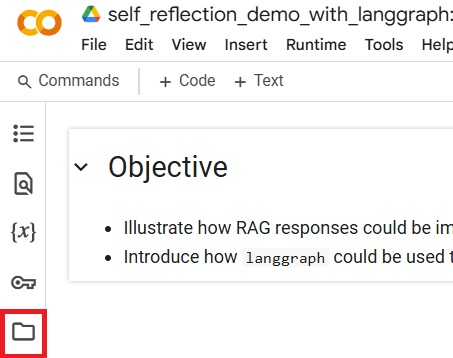

Step 2: Click on the next icon highlighted in red.

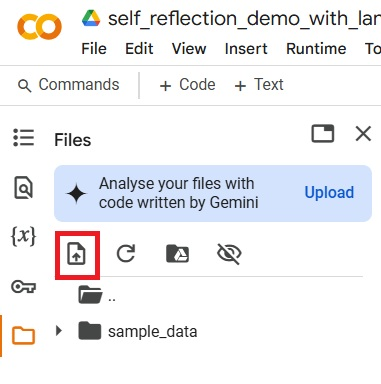

Step 3: Select config.json from the Downloads and click on open highlighted in red box.

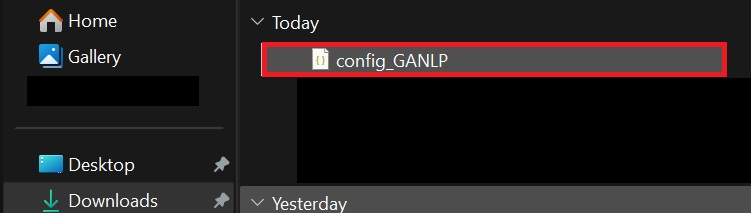

Step 4: A warning message will appear—click OK to proceed.

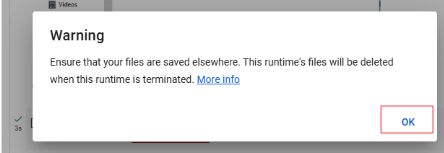

In [ ]:
import json

def read_config(config_file):
  """Reads a JSON config file and returns a dictionary."""
  with open(config_file, 'r') as f:
    return json.load(f)

config = read_config("config_GANLP.json")  #Copy and paste the path of the config file uploaded in Colab
config2 = read_config("config2_emb_tested.json")
api_key = config.get("API_KEY")
endpoint = config.get("OPENAI_API_BASE")
llamaparse_api_key = config2.get("LLAMA_KEY")

In [ ]:
embedding_function = chromadb.utils.embedding_functions.OpenAIEmbeddingFunction(
    api_base=endpoint,
    api_key=api_key,
    model_name='text-embedding-ada-002'
)

In [ ]:
# Initialize OpenAI Embeddings correctly
embedding_model = OpenAIEmbeddings(
    openai_api_base=endpoint,
    openai_api_key=api_key,
    model="text-embedding-ada-002"
)

In [ ]:
from langchain_openai import ChatOpenAI

llm = ChatOpenAI(
    openai_api_base=endpoint,
    openai_api_key=api_key,
    model="gpt-4o-mini",
    streaming=False  # Explicitly disabling streaming
)

In [ ]:
Settings.llm = llm
Settings.embedding = embedding_model

### llama parse

In [ ]:
# llama-parse is async-first, running the async code in a notebook requires the use of nest_asyncio
import nest_asyncio

nest_asyncio.apply()

In [ ]:
parser = LlamaParse(
    result_type="markdown",
    skip_diagonal_text=True,
    fast_mode=False,
    num_workers=9,
    check_interval=10,
    api_key=llamaparse_api_key
)

## what is this code doing:

- The code is parsing PDFs in a folder, extracting structured content (like text as JSON) and images, and storing them in separate lists.

- json_objs: will hold parsed JSON objects from the PDFs (likely representing structured text or metadata).
- image_dicts: will hold dictionaries representing extracted images (possibly metadata like image path, position, etc.).


```python
for pdf in os.listdir("image_papers"):
  if pdf.endswith(".pdf"):
```    

- Goes through all files in the folder image_papers/.
- Only processes files that end with .pdf.

```python
json_objs.extend(parser.get_json_result("image_papers/" + pdf))
```

- Calls parser.get_json_result(...) to extract structured data (text, metadata) from the PDF.
- The result is appended to json_objs.

Example:

If the PDF contains structured text like headings, paragraphs, or tables, this function likely returns it in JSON format.

```python
image_dicts.extend(parser.get_images(
    json_objs,
    download_path="images_folder"
))
```
- Calls parser.get_images(...) using the already-parsed json_objs.
- Downloads or extracts images from those PDFs to images_folder/.
- Each image’s metadata (like file path, page number, bounding box) is added to image_dicts.


✅ Final Outcome

After the loop:
- json_objs: contains all structured text from the PDFs.
- image_dicts: contains data about all extracted images (and possibly paths to saved images).

**At the end:**
- **json_objs looks like this**

```csv
[{'pages': [{'page': 1,
    'text': '     Neurobiology of Learning and Memory 75, 1–9 (2001)\n     doi:10.1006/nlme.2000.3999, available online at http://www.idealibrary.com on IDE\n                         RAPID COMMUNICATION\n                                    Sex-Related Difference in Amygdala\n                                  Activity during Emotionally Influenced\n                                              Memory Storage\n           Larry Cahill,* Richard J. Haier,† Nathan S. White,‡ James Fallon,§ Lisa Kilpatrick,*\n                        Chris Lawrence,* Steven G. Potkin,| and Michael T. Alkire‡\n     *Department of Neurobiology and Behavior and Center for the Neurobiology of Learning and Memory,\n           *Department of Pediatrics, *Department of Anesthesiology, §Department of Anatomy and\n              Neurobiology, |Department of Psychiatry and Human Behavior, University of California,\n                                          Irvine, CA 92697-3800\n                                        Accepted November 13, 2000\n               We tested the possibility suggested by previous imaging studies that amygdala\n             participation in the storage of emotionally influenced memory is differentially\n            lateralized in men and women. Male and female subjects received two PET scans for\n             regional cerebral glucose—one while viewing a series of emotionally provocative\n            (negative) films, and a second while viewing a series of matched, but emotionally\n            more neutral, films. Consistent with suggestions from several previously published\n          studies, enhanced activity of the right, but not the left, amygdala in men was related\n             to enhanced memory for the emotional films. Conversely, enhanced activity of the\n  


```


- **image_dicts looks like this**
```csv
[{'name': 'img_p0_1.png',
  'height': 37,
  'width': 80,
  'x': 278.1167,
  'y': 24.412889999999972,
  'original_width': 80,
  'original_height': 37,
  'ocr': [{'x': 0,
    'y': 2,
    'w': 38,
    'h': 28,
    'confidence': '0.8780810996852318',
    'text': 'IDE'}],
  'path': 'images_folder/3e909d94-a951-4968-98e1-a15542dd1b16-img_p0_1.png',
  'job_id': '3e909d94-a951-4968-98e1-a15542dd1b16',
  'original_file_path': 'image_papers/Sex-Related Difference in Amygdala.pdf',
  'page_number': 1},
 {'name': 'img_p0_2.png',
  'height': 101,
  'width': 100,
  ```



In [ ]:
json_objs =[]
image_dicts = []

# Parse content from pdfs

for pdf in os.listdir("image_papers"):
  if pdf.endswith(".pdf"):
    json_objs.extend(parser.get_json_result("image_papers/"+pdf))
    image_dicts.extend(parser.get_images(
    json_objs,
    download_path="images_folder"
    ))

Started parsing the file under job_id 3fc891ed-01be-41d6-93c0-14bbcc716ad2
> Images for page 1: [{'name': 'img_p0_1.png', 'height': 37, 'width': 80, 'x': 278.1167, 'y': 24.412889999999972, 'original_width': 80, 'original_height': 37, 'ocr': [{'x': 0, 'y': 2, 'w': 38, 'h': 28, 'confidence': '0.8780810996852318', 'text': 'IDE'}]}, {'name': 'img_p0_2.png', 'height': 101, 'width': 100, 'x': 18.08759999999998, 'y': 629.1888900000001, 'original_width': 100, 'original_height': 101, 'ocr': [{'x': 23, 'y': 13, 'w': 76, 'h': 66, 'confidence': '0.9954906392824938', 'text': 'A'}]}]
> Images for page 2: []
> Images for page 3: []
> Images for page 4: []
> Images for page 5: [{'name': 'img_p4_1.png', 'height': 2509, 'width': 2218, 'x': 17.313399999999987, 'y': 55.62589000000003, 'original_width': 2218, 'original_height': 2509, 'ocr': [{'x': 237, 'y': 61, 'w': 492, 'h': 108, 'confidence': '0.9999820338318962', 'text': 'WOMEN'}, {'x': 1583, 'y': 65, 'w': 288, 'h': 108, 'confidence': '0.999967858553506

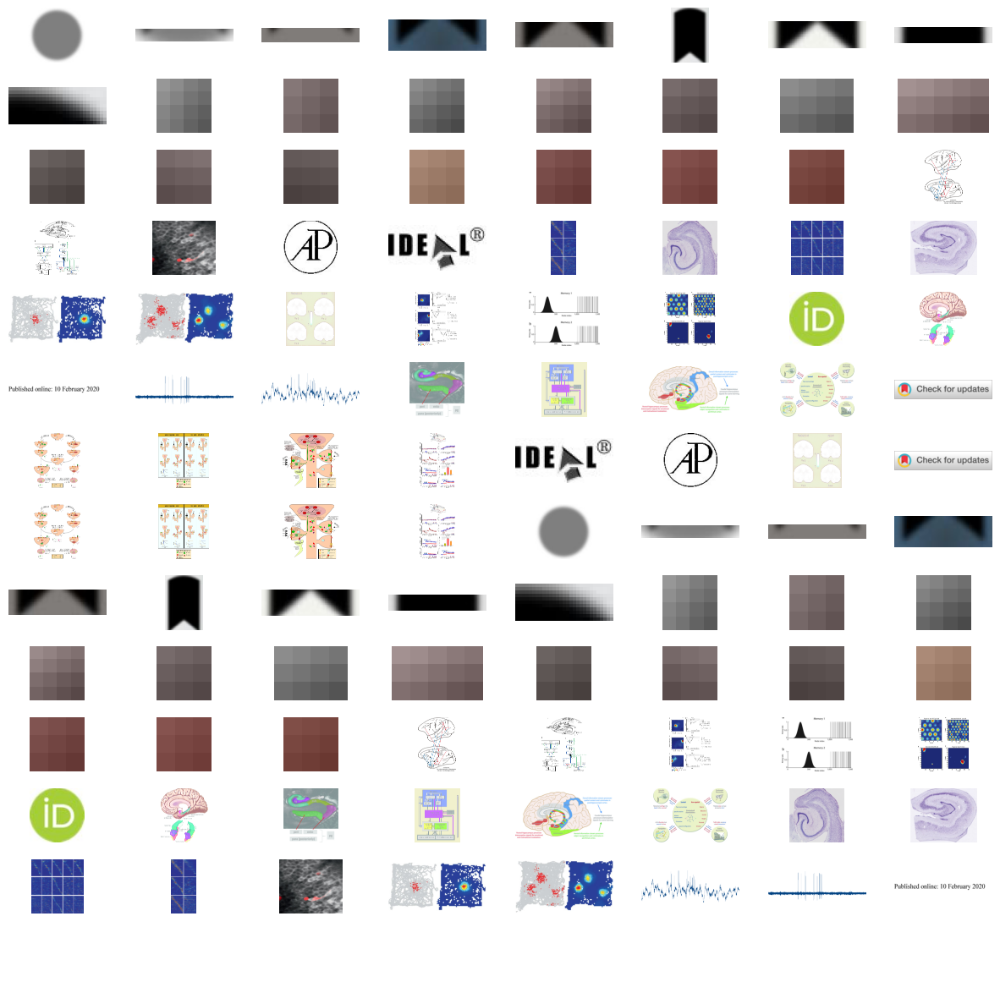

In [ ]:
# Dont worry about the code here, this is just to show the images we have extracted from the papers
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from PIL import Image
import numpy as np

def plot_images_grid(image_folder):
    """Plots images from a folder in a grid format with smaller size."""

    # Filter for valid image files
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(valid_extensions) and os.path.isfile(os.path.join(image_folder, f))]

    num_images = len(image_files)
    grid_size = (num_images // 8 + 1, 8) if num_images > 8 else (1, num_images)
    fig, axs = plt.subplots(grid_size[0], grid_size[1], figsize=(15, 15))
    fig.subplots_adjust(hspace=0.3, wspace=0.3)

    for i, image_file in enumerate(image_files):
        if i >= grid_size[0] * grid_size[1]:
            break

        image_path = os.path.join(image_folder, image_file)
        try:
            # Verify the image format and resize
            with Image.open(image_path) as img:
                img.verify()  # Verify that it is, in fact, an image
                img = Image.open(image_path)
                img = np.array(img)
                row = i // grid_size[1]
                col = i % grid_size[1]
                axs[row, col].imshow(img)
                axs[row, col].axis('off')
        except Exception as e:
            print(f"Error loading {image_file}: {e}")

    # Hide any unused subplots
    for j in range(i + 1, grid_size[0] * grid_size[1]):
        row = j // grid_size[1]
        col = j % grid_size[1]
        axs[row, col].axis('off')

    plt.show()


plot_images_grid('images_folder')

In [ ]:
len(json_objs)

5

In [ ]:
# pretty print json object json_objs[0]

import json

print(json.dumps(json_objs[0], indent=4))

{
    "pages": [
        {
            "page": 1,
            "text": "     Neurobiology of Learning and Memory 75, 1\u20139 (2001)\n     doi:10.1006/nlme.2000.3999, available online at http://www.idealibrary.com on IDE\n                         RAPID COMMUNICATION\n                                    Sex-Related Difference in Amygdala\n                                  Activity during Emotionally Influenced\n                                              Memory Storage\n           Larry Cahill,* Richard J. Haier,\u2020 Nathan S. White,\u2021 James Fallon,\u00a7 Lisa Kilpatrick,*\n                        Chris Lawrence,* Steven G. Potkin,| and Michael T. Alkire\u2021\n     *Department of Neurobiology and Behavior and Center for the Neurobiology of Learning and Memory,\n           *Department of Pediatrics, *Department of Anesthesiology, \u00a7Department of Anatomy and\n              Neurobiology, |Department of Psychiatry and Human Behavior, University of California,\n                  

In [ ]:
json_objs[1]["file_path"]

'image_papers/Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf'

**Extracting tables from the json file.**

In [ ]:
page_texts, tables = {}, {}
for obj in json_objs:
    json_list = obj['pages']
    name = obj["file_path"].split("/")[-1]
    page_texts[name] = {}
    tables[name] = {}
    for json_item in json_list:

        for component in json_item['items']:
            if component['type'] == 'table':
                tables[name][json_item['page']] = component['rows']

In [ ]:
tables

{'Sex-Related Difference in Amygdala.pdf': {1: [[],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   []],
  5: [['WOMEN', 'MEN'], ['Y= 0', 'Y= -2'], ['Y= 2', 'Y= -4']],
  6: [[],
   [],
   ['SEX', 'Coordinatesᵃ (x, y, z mm)', 'Voxels', 'Z score', 'P value'],
   ['---', '---', '---', '---', '---'],
   ['Men (right amygdala)', '22, 4, 224', '23', '2.93', '0.02'],
   ['Women (left amygdala)', '214, 2, 222', '17', '2.59', '0.05']]},
 'Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf': {4: [['Ca2+',
    'HW)',
    'LTD',
    'Induction'],
   ['HA)', 'CaMKII Kinases', '', 'Phosphatases'],
   ['CaMKII', '', 'AHAA', "'Phosphatases"],
   ['Returns to baseline (early-LTP/LTD)',
    'Returns to baseline (early-LTP/LTD)',
    'Returns to baseline (early-LTP/LTD)',
    'Returns to baseline (early-LTP/LTD)'],
   ['BDNF', '', 'Pro-', 'BDNF'],
   ['M', 'TrkB Receptor', '', 'PZS(NTR)'],
   ['PKMZ', '#', 'AHHOA', ''],
   ['time', 'time', 'Phosphatases', '']

In [ ]:
for i in tables:
  print(i)
  for j in tables[i]:
    print(j)
    print(tables[i][j])


Sex-Related Difference in Amygdala.pdf
1
[[], [], [], [], [], [], [], [], [], []]
5
[['WOMEN', 'MEN'], ['Y= 0', 'Y= -2'], ['Y= 2', 'Y= -4']]
6
[[], [], ['SEX', 'Coordinatesᵃ (x, y, z mm)', 'Voxels', 'Z score', 'P value'], ['---', '---', '---', '---', '---'], ['Men (right amygdala)', '22, 4, 224', '23', '2.93', '0.02'], ['Women (left amygdala)', '214, 2, 222', '17', '2.59', '0.05']]
Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf
4
[['Ca2+', 'HW)', 'LTD', 'Induction'], ['HA)', 'CaMKII Kinases', '', 'Phosphatases'], ['CaMKII', '', 'AHAA', "'Phosphatases"], ['Returns to baseline (early-LTP/LTD)', 'Returns to baseline (early-LTP/LTD)', 'Returns to baseline (early-LTP/LTD)', 'Returns to baseline (early-LTP/LTD)'], ['BDNF', '', 'Pro-', 'BDNF'], ['M', 'TrkB Receptor', '', 'PZS(NTR)'], ['PKMZ', '#', 'AHHOA', ''], ['time', 'time', 'Phosphatases', ''], ['de novo protein synthesis', 'de novo protein synthesis', 'de novo protein synthesis', ''], ['Increased sp

Now that we have extracted and seperated all the required modalities, let's now process each of them starting with text.

# Text Processing

#### PDF Parse

We will use pdfloader in conjunction with out of the box chunkers. The llamaparse output also has text that we need however, we will need to do wrangle it to get it in the right format for the chunkers. We will skip that and proceed with the more straight forward pdf_loaders+chunking. In production, you must weigh your options of ease vs speed. It will require experimentation to figure out which strategy work best at large scale. At our scale, it doesn't matter much.

In [ ]:
chromadb_client = chromadb.EphemeralClient()

In [ ]:
pdf_folder_location = "image_papers"

In [ ]:
pdf_loader = PyPDFDirectoryLoader(pdf_folder_location)

The first chunking strategy we are going to check out is character text splitter which will chunk the text based on character count.

In [ ]:
character_text_splitter = CharacterTextSplitter.from_tiktoken_encoder(
    encoding_name='cl100k_base',
    chunk_size=512,
    chunk_overlap=16,
    separator=''
)

report_chunks = pdf_loader.load_and_split(character_text_splitter)

In [ ]:
report_chunks[0]

Document(metadata={'producer': 'Acrobat Distiller 3.02 for Power Macintosh', 'creator': 'SYSTEM400 Rev 15.05', 'creationdate': 'D:20001213175705', 'title': 'Neurobiology of Learning and Memory', 'subject': 'Sex-Related Difference in Amygdala\rActivity during Emotionally Influenced\rMemory Storage', 'author': 'Larry Cahill, Richard J. Haier, Nathan S. White, James Fallon, Lisa Kilpatrick,\rChris Lawrence, Steven G. Potkin, and Michael T. Alkire', 'keywords': 'None', 'moddate': '2000-12-13T21:55:35+08:00', 'source': 'image_papers/Sex-Related Difference in Amygdala.pdf', 'total_pages': 9, 'page': 0, 'page_label': '1'}, page_content='Neurobiology of Learning and Memory75,1±9 (2001)\ndoi:10.1006/nlme.2000.3999, available online at http://www.idealibrary.com on\nRAPID COMMUNICATION\nSex-Related Difference in Amygdala\nActivity during Emotionally Influenced\nMemory Storage\nLarry Cahill,* Richard J. Haier,² Nathan S. White,³ James Fallon,§ Lisa Kilpatrick,*\nChris Lawrence,* Steven G. Potkin,

In [ ]:
len(report_chunks)

883

In [ ]:
chunks = [Document(id=i, page_content = d.page_content, metadata = d.metadata) for i, d in zip(range(len(report_chunks)),report_chunks)]

In [ ]:
vectorstore = Chroma.from_documents(
    chunks,
    embedding_model,
    collection_name="full_document_chunks",
    persist_directory='./reports_db'
)

## Structured retrieval and Self Query

In [ ]:
metadata_field_info = [
    AttributeInfo(
        name="Source",
        description="Name of the research paper",
        type="string"
    ),
    AttributeInfo(
        name="page",
        description="page within the research paper that the document belongs to",
        type="integer"
    )
]

document_content_description = "information mentioned in the research paper"

A self-querying retriever is one that, as the name suggests, has the ability to query itself. Specifically, given any natural language query, the retriever uses a query-constructing LLM chain to write a structured query and then applies that structured query to its underlying VectorStore. This allows the retriever to not only use the user-input query for semantic similarity comparison with the contents of stored documents but to also extract filters from the user query on the metadata of stored documents and to execute those filters.

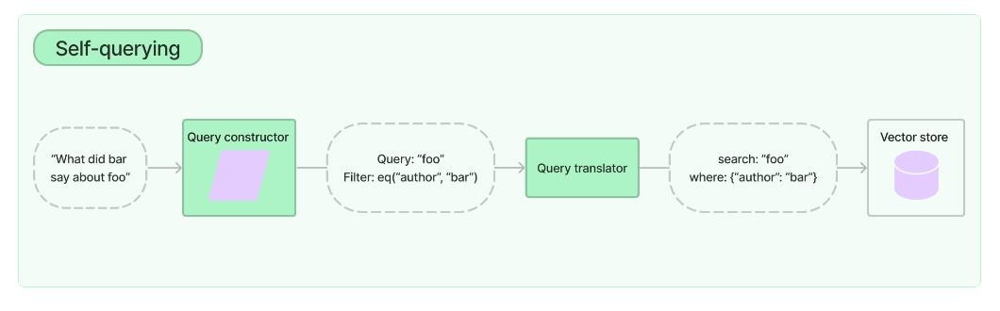

Check more [here](https://python.langchain.com/docs/how_to/self_query/#:~:text=A%20self%2Dquerying%20retriever%20is,the%20ability%20to%20query%20itself.)

In [ ]:
structured_retriever = SelfQueryRetriever.from_llm(
    llm,
    vectorstore,
    document_content_description,
    metadata_field_info
)


In [ ]:
user_input = "what are the parts involved in memory?"

In [ ]:
structured_retriever.invoke(user_input)


[Document(metadata={'author': 'Thomas Hainmueller', 'creationdate': '2020-02-08T00:22:09+05:30', 'creator': 'Springer', 'crossmarkdomains[1]': 'springer.com', 'crossmarkdomains[2]': 'springerlink.com', 'doi': '10.1038/s41583-019-0260-z', 'keywords': '', 'moddate': '2020-02-08T00:23:29+05:30', 'page': 0, 'page_label': '1', 'producer': 'PyPDF', 'source': 'image_papers/Dentate gyrus circuits for encoding, retrieval, and discrimination of episodic memories.pdf', 'subject': 'Nature Reviews Neuroscience, doi:10.1038/s41583-019-0260-z', 'title': 'Dentate gyrus circuits for encoding, retrieval and discrimination of episodic memories', 'total_pages': 16}, page_content='Memories about ourselves and our interactions with \nthe environment are fundamental to our life. Conscious \nor ‘declarative’ memories come in two flavours 1: \nsemantic memories  comprise factual knowledge about \nthe world (for example, that Brooklyn is a borough of  \nNew Y ork), whereas episodic memories  depict unique  \nex

In [ ]:
docs = vectorstore.similarity_search(user_input, k=5)

In [ ]:
for i in docs:
  print("source", i.metadata['source'])
  print("page", i.metadata['page'],"\n")
  print(i.page_content)


source image_papers/colour print - Memory the role of Medial temporal lobe.pdf
page 0 

FUNCTIONAL VIGNETTE
Memory Part 2: The Role of the Medial Temporal Lobe
F.D. Raslau, I.T. Mark, A.P. Klein, J.L. Ulmer, V. Mathews, andX
 L.P. Mark
T
he medial temporal lobe plays a central role in memory
processing and is more than just the hippocampus.1 The
hippocampal formation, which forms the upper segment of the
medial temporal lobe, is a heterogeneous structure consisting
of the Ammon horn or Cornus Ammonis (Cornus Ammonis
area 1 to Cornus Ammonis area 4) and the dentate gyrus ap-
pearing as 2 interl
source image_papers/colour print - Memory the role of Medial temporal lobe.pdf
page 0 

FUNCTIONAL VIGNETTE
Memory Part 2: The Role of the Medial Temporal Lobe
F.D. Raslau, I.T. Mark, A.P. Klein, J.L. Ulmer, V. Mathews, andX
 L.P. Mark
T
he medial temporal lobe plays a central role in memory
processing and is more than just the hippocampus.1 The
hippocampal formation, which forms the upper segmen

We can see that some of the retrieved content is cut off abruptly in the middle of words and sentences. This is a problem with charcter level chunking. Let's try a smarter chunking strategy - Semantic Chunking.

## Semantic Chunking


"Semantic chunking" is proposed by Greg Kamradt in his video tutorial on 5 levels of embedding chunking: https://youtu.be/8OJC21T2SL4?t=1933.

Instead of chunking text with a fixed chunk size, the semantic splitter adaptively picks the breakpoint in-between sentences using embedding similarity. This ensures that a "chunk" contains sentences that are semantically related to each other.

In [ ]:
# Semantic chunking

semantic_text_splitter = SemanticChunker(
    embedding_model,
    breakpoint_threshold_type='gradient'
)

semantic_chunks = pdf_loader.load_and_split(semantic_text_splitter)

In [ ]:
semantic_chunks[2]

Document(metadata={'producer': 'Acrobat Distiller 3.02 for Power Macintosh', 'creator': 'SYSTEM400 Rev 15.05', 'creationdate': 'D:20001213175705', 'title': 'Neurobiology of Learning and Memory', 'subject': 'Sex-Related Difference in Amygdala\rActivity during Emotionally Influenced\rMemory Storage', 'author': 'Larry Cahill, Richard J. Haier, Nathan S. White, James Fallon, Lisa Kilpatrick,\rChris Lawrence, Steven G. Potkin, and Michael T. Alkire', 'keywords': 'None', 'moddate': '2000-12-13T21:55:35+08:00', 'source': 'image_papers/Sex-Related Difference in Amygdala.pdf', 'total_pages': 9, 'page': 1, 'page_label': '2'}, page_content='2 CAHILL ET AL\nSeveral recent human brain imaging studies have provided strong additional support for\nthis view (Cahill et al., 1996; Canli, Zhao, Brewer, Gabrieli, & Cahill, 2000; Canli, Zhao,\nDesmond, Glover, & Gabrieli, 1999; Hamann et al., 1999). In each, activity of the amygdala\nwhile subjects viewed emotionally provocative stimuli correlated with the

In [ ]:
len(semantic_chunks[2].page_content)

1522

In [ ]:
for i, document in enumerate(semantic_chunks):
  print(len(document.page_content))

261
2260
1522
432
1378
104
1599
1786
3481
121
12
180
507
1599
1435
187
3774
3035
673
222
55
360
1063
180
428
1304
334
574
3764
193
64
4787
440
401
48
4167
722
730
513
401
5
4000
1386
349
210
4631
401
2820
2700
349
1403
498
85
2227
3035
349
5032
411
401
68
917
4380
349
383
1772
106
5236
349
96
401
1952
1168
903
1701
154
5159
401
1708
697
2015
498
4920
96
401
3074
598
1290
349
120
4781
401
149
4970
349
181
1704
3396
185
4859
349
159
4564
498
195
3098
2197
786
401
85
2636
1789
156
230
5512
1071
120
3605
410
308
659
2083
3635
39
1987
363
82
3740
428
2292
30
5669
88
355
4167
1582
1407
1115
3276
6091
33
39
523
5381
135
1231
3743
884
43
2676
173
4498
1563
5287
34
752
5124
1133
39
179
75
1902
3921
1040
1049
3513
4015
1614
159
5223
10
815
1763
4406
458
219
195
450
6236
313
3855
2833
167
184
6733
163
151
193
4113
1981
1054
1070
66
76
3460
178
397
4074
2210
32
270
1704
688
384
4245
590
1326
1531
3690
3362
37
1577
1793
458
78
3997
2683
6447
387
26
162
1044
993
5172
2467
26
27
480
5054
2212
2621
12

In [ ]:
len(semantic_chunks)

319

Let's add ID to the documents.

In [ ]:
semantic_chunks = [Document(id=i, page_content = d.page_content, metadata = d.metadata) for i, d in enumerate(semantic_chunks)]

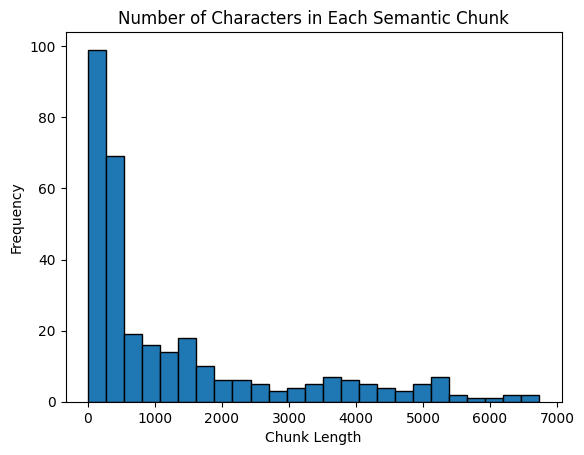

In [ ]:
# plot a graph of number of characters in each chunk of semantic_chunks

import matplotlib.pyplot as plt

chunk_lengths = [len(chunk.page_content) for chunk in semantic_chunks]

plt.hist(chunk_lengths,bins = 25, edgecolor = 'black')
plt.xlabel('Chunk Length')
plt.ylabel('Frequency')
plt.title('Number of Characters in Each Semantic Chunk')
plt.show()

In [ ]:
semanticstore = Chroma.from_documents(
    semantic_chunks,
    embedding_model,
    collection_name="semantic_chunks",
    persist_directory='./research_db')


In [ ]:
structured_retriever = SelfQueryRetriever.from_llm(
    llm,
    semanticstore,
    document_content_description,
    metadata_field_info
)


In [ ]:
structured_retriever.invoke(user_input)

[Document(metadata={'creationdate': '2022-04-12T21:56:34+05:30', 'creator': 'Arbortext Advanced Print Publisher 9.1.531/W Unicode', 'moddate': '2023-03-05T11:45:43-08:00', 'page': 1, 'page_label': '2', 'producer': 'Acrobat Distiller 10.1.16 (Windows); modified using iText 4.2.0 by 1T3XT', 'source': 'image_papers/Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf', 'subject': 'The FEBS Journal 2022.289:2176-2201', 'title': 'Long‐term plasticity in the hippocampus: maintaining within and ‘tagging’ between synapses', 'total_pages': 26, 'wps-articledoi': '10.1111/febs.16065', 'wps-journaldoi': '10.1111/(ISSN)1742-4658', 'wps-proclevel': '3'}, page_content='memory, allowing the learning, training and storage of\nmemories.'),
 Document(metadata={'creationdate': '2022-04-12T21:56:34+05:30', 'creator': 'Arbortext Advanced Print Publisher 9.1.531/W Unicode', 'moddate': '2023-03-05T11:45:43-08:00', 'page': 1, 'page_label': '2', 'producer': 'Acrobat Distiller 10

## Hypothetical Questions

Traditional Retrieval-Augmented Generation (RAG) matches a user’s query with document embeddings based on semantic similarity. However, user queries are typically short, while document chunks tend to be longer and more detailed. This difference in length often leads to retrieval mismatches, where irrelevant or overly broad document chunks are returned. For instance, a query like "What is the capital of France?" might retrieve chunks discussing unrelated aspects of France or other capitals due to the semantic overlap in the embeddings.

The Hypothetical Questions strategy addresses this by generating focused questions for each document chunk. These questions are embedded, and the user’s query is matched against them instead. By mapping these questions back to specific document chunks using metadata, we can retrieve the most relevant content, resolving the length discrepancy issue.

In [ ]:
# Hypothetical Questions

hypothetical_questions_prompt = """
Generate a list of exactly 3 hypothetical questions that the below document could be used to answer:
{doc}
Generate only a list of questions. Do not mention anything before or after the list.
If the content cannot answer any questions - return empty list.
"""


In [ ]:
hyp_docs = []

In [ ]:
import json

def read_config(config_file):
  """Reads a JSON config file and returns a dictionary."""
  with open(config_file, 'r') as f:
    return json.load(f)

config = read_config("config_GANLP.json")
config2 = read_config("config2_emb_tested.json")
api_key = config.get("API_KEY")
endpoint = config.get("OPENAI_API_BASE")
llamaparse_api_key = config2.get("LLAMA_KEY")

## Trying with Exponential Backoff

In [ ]:
import time

def invoke_with_backoff(doc, retries=5):
    delay = 2
    for attempt in range(retries):
        try:
            time.sleep(6)
            return llm.invoke(hypothetical_questions_prompt.format(doc=doc)).content
        except Exception as e:
            if '429' in str(e):
                print(f"Rate limit hit. Retrying in {delay} seconds...")
                time.sleep(delay)
                delay *= 2  # Exponential backoff
            else:
                print(e)
                return "NA"
    return "NA"  # After retries exhausted

for i, document in enumerate(semantic_chunks):
    print (f"Procesing {i}/{len(semantic_chunks)}")
    print(f"Length of doc: {len(document.page_content)}")
    if len(document.page_content) > 1000:
        time.sleep(5)

    if i != 0 and i % 10 == 0:
      time.sleep(60)

    questions = invoke_with_backoff(document.page_content)

    questions_metadata = {
        'original_content': document.page_content,
        'source': document.metadata['source'],
        'page': document.metadata['page'],
        'type': 'text'
    }

    hyp_docs.append(
        Document(
            id=str(i),
            page_content=questions,
            metadata=questions_metadata
        )
    )

Procesing 0/319
Length of doc: 261
Procesing 1/319
Length of doc: 2260
Procesing 2/319
Length of doc: 1522
Procesing 3/319
Length of doc: 432
Procesing 4/319
Length of doc: 1378
Procesing 5/319
Length of doc: 104
Procesing 6/319
Length of doc: 1599
Procesing 7/319
Length of doc: 1786
Procesing 8/319
Length of doc: 3481
Procesing 9/319
Length of doc: 121
Procesing 10/319
Length of doc: 12
Procesing 11/319
Length of doc: 180
Procesing 12/319
Length of doc: 507
Procesing 13/319
Length of doc: 1599
Procesing 14/319
Length of doc: 1435
Procesing 15/319
Length of doc: 187
Procesing 16/319
Length of doc: 3774
Procesing 17/319
Length of doc: 3035
Procesing 18/319
Length of doc: 673
Procesing 19/319
Length of doc: 222
Procesing 20/319
Length of doc: 55
Procesing 21/319
Length of doc: 360
Procesing 22/319
Length of doc: 1063
Procesing 23/319
Length of doc: 180
Procesing 24/319
Length of doc: 428
Procesing 25/319
Length of doc: 1304
Procesing 26/319
Length of doc: 334
Procesing 27/319
Length of d

In [ ]:
# import time

# for i, document in enumerate(semantic_chunks):

#     try:
#         response = llm.invoke(hypothetical_questions_prompt.format(doc=document.page_content))
#         questions = response.content
#         time.sleep(1)  # wait 1 second between calls
#     except Exception as e:
#         print(e)
#         questions = "NA"

#     questions_metadata = {
#         'original_content': document.page_content, # content in the original chunk
#         'source':document.metadata['source'], # Source of the original chunk
#         'page': document.metadata['page'], # page number of the original chunk
#         'type': 'text' # this will help us selectively retrieve images, text or tables
#     }

#     hyp_docs.append(
#         Document(
#             id=str(i),
#             page_content=questions,
#             metadata=questions_metadata
#         )
#     )

In [ ]:
len(hyp_docs)

431

In [ ]:
def print_sample(docs,index = 0):
  print("id \n", docs[index].id, "\n")
  print("metadata")
  print(json.dumps(docs[index].metadata, indent=4)," \n")
  print("Hyp Questions \n",docs[index].page_content)
print_sample(hyp_docs,20)

id 
 20 

metadata
{
    "original_content": "AMYGDALA, GENDER DIFFERENCES, AND MEMORY 9\nDavidson, R.",
    "source": "image_papers/Sex-Related Difference in Amygdala.pdf",
    "page": 8,
    "type": "text"
}  

Hyp Questions 
 1. How does the amygdala function differently between genders in relation to memory processing?
2. What are the implications of gender differences in the amygdala for understanding emotional memories?
3. In what ways might research on the amygdala contribute to our knowledge of memory differences between men and women?


In [ ]:
hyp_docs[0]

## Notice the different usage of Chroma DB here:

- Yes — you’re **using two different methods for working with Chroma DB,** and they operate at different abstraction levels:

🧩 1. **Chroma.from_documents(...)**

**High-level LangChain abstraction**

```python
semanticstore = Chroma.from_documents(
    semantic_chunks,
    embedding_model,
    collection_name="semantic_chunks",
    persist_directory='./research_db'
)
```

- **What it does:**
Automatically creates a Chroma vector store from documents using LangChain.

- Handles:
  - Embedding each document with embedding_model
  - Creating and managing the Chroma collection
  - Persisting it to disk if persist_directory is specified
  - **Returns:** a LangChain VectorStore object that wraps Chroma.
  - **Use Case:** When you want tight integration with LangChain workflows like RetrievalQA, ConversationalRetrievalChain, etc.


⚙️ **2. chromadb_client.get_or_create_collection(...)**

**Low-level native Chroma client usage**

```python
collection = chromadb_client.get_or_create_collection(
    name='research',
    metadata={"hnsw:space": "cosine"},
    embedding_function=embedding_function
)
```

**To add persistent directory with native chroma**

```python
from chromadb.config import Settings
import chromadb

client = chromadb.Client(Settings(
    chroma_db_impl="duckdb+parquet",
    persist_directory="./chroma_persist"  # specify directory here
))

collection = client.get_or_create_collection(
    name='research',
    metadata={"hnsw:space": "cosine"},
    embedding_function=embedding_function
)
```

- **What it does:**
Uses the raw Chroma Python client to get or create a collection named "research" with custom metadata and embedding function.

- You must manually:
  - Add documents using collection.add(...)
  - Handle text splitting, embedding, and metadata management yourself
  - Use Case: When you want full control over how documents are embedded, stored, and retrieved — or you’re not using LangChain.

| Feature                        | `Chroma.from_documents()`                 | `chromadb_client.get_or_create_collection()` |
|--------------------------------|-------------------------------------------|----------------------------------------------|
| **Abstraction Level**          | High (LangChain wrapper)                  | Low (native Chroma client)                   |
| **Embedding handled?**         | Yes (via `embedding_model`)               | No (you must embed manually)                 |
| **Use with LangChain Retrievals** | ✅ Ideal                                | ❌ Manual integration needed                  |
| **Custom control**             | ❌ Less granular                           | ✅ Full control                               |  

🔍 **What Is metadata={"hnsw:space": "cosine"}?**

This metadata dictionary is used to configure the underlying** HNSW index** for similarity search within the Chroma collection.

⚙️ Key Points
- **HNSW Index:**

**HNSW (Hierarchical Navigable Small World)** is an algorithm for efficient similarity searches in high-dimensional data.
- **“hnsw:space” Parameter:**
- Setting "hnsw:space": "cosine" tells the system to use cosine similarity as the distance metric.
- **Cosine Similarity:**
- Measures how similar two vectors are by comparing the cosine of the angle between them. It is especially useful for text embeddings.
- **Purpose in Chroma:**

This configuration affects how similarity is calculated when performing searches within the collection.
- It determines how the embedded vectors are compared.
- Helps in retrieving the most similar items based on cosine distance.

In [ ]:
collection = chromadb_client.get_or_create_collection(
    name='research',
    metadata={"hnsw:space": "cosine"},
    embedding_function=embedding_function
)

In [ ]:
collection.add(
    ids=[d.id for d in hyp_docs],
    documents=[d.page_content for d in hyp_docs],
    metadatas=[d.metadata for d in hyp_docs]
)

DuplicateIDError: Expected IDs to be unique, found 112 duplicated IDs: 69, 50, 2, 4, 55, ..., 57, 43, 32, 94, 7 in add.

Yes, it is another approach. By specifying the persist_directory parameter in the Chroma constructor, you’re instructing the system to store the collection data on disk at the given directory. This approach embeds persistence directly into the vector store instance rather than configuring it via the client.

| Approach                                | How It Works                                                                                               |
|----------------------------------------|------------------------------------------------------------------------------------------------------------|
| **Persistent Directory via Client Settings** | Configure persistence when initializing the Chroma client (e.g., in `Settings`) so that all collections are stored in that directory. |
| **Persistent Directory via Chroma Constructor** | Directly pass the `persist_directory` parameter in the `Chroma` constructor, embedding persistence into the vector store instance.       |

In [ ]:
hypstore = Chroma(
    client=chromadb_client,
    collection_name="research",
    embedding_function=embedding_model,
    persist_directory='./research'
)

In [ ]:
hypo_retriever = hypstore.as_retriever(
    search_type="similarity",
    search_kwargs={'k': 5}
)


In [ ]:
hypothetical_questions_retrieved = hypo_retriever.invoke(user_input)

In [ ]:
print_sample(hypothetical_questions_retrieved)

In [ ]:
metadata_field_info = [
    AttributeInfo(
        name="source",
        description="Name of the research paper the parent chunk belongs to",
        type="string"
    ),
    AttributeInfo(
        name="page",
        description="page number parent chunk belongs to",
        type="integer"
    ),

    AttributeInfo(
        name="original_content",
        description="content of the original page - you do not have to look a this",
        type="string"
    ),
    AttributeInfo(
    name="type",
    description="original content type of the embedding. value can be 'text', 'image' or 'table'.",
    type="string"
)
]

document_content_description = "Questions that the content within the parent chunk can answer"



structured_hyp_retriever = SelfQueryRetriever.from_llm(
    llm,
    hypstore,
    document_content_description,
    metadata_field_info
)

In [ ]:
hypothetical_questions_retrieved = structured_hyp_retriever.invoke(user_input)

In [ ]:
print_sample(hypothetical_questions_retrieved,3)

## Table Encoding

In [ ]:
# Hypothetical Questions

hypothetical_questions_prompt = """
Generate a list of exactly 3 hypothetical questions that the below table could be used to answer:
{table}
Generate only a list of questions. Do not mention anything before or after the list.
"""


In [ ]:
hypotheticalq_tables = []

for source in tables:
    for page in tables[source]:
      table_in_page = tables[source][page]
      try:
          response = llm.invoke(hypothetical_questions_prompt.format(table=table_in_page))

          questions = response.content
      except Exception as e:
          print(e)
          questions = "NA"

      questions_metadata = {
          'original_content': str(table_in_page),
          'source':source,
          'page': page,
          'type': 'table'
      }


      hypotheticalq_tables.append(
          Document(
              id = "table_"+ source+"_"+str(page),
              page_content=questions,
              metadata=questions_metadata
          )
      )


In [ ]:
hypotheticalq_tables

[Document(id='table_Sex-Related Difference in Amygdala.pdf_1', metadata={'original_content': '[[], [], [], [], [], [], [], [], [], []]', 'source': 'Sex-Related Difference in Amygdala.pdf', 'page': 1, 'type': 'table'}, page_content='1. What are the potential outcomes of an experiment with ten independent trials?\n2. How might various factors influence the results in a dataset with ten categories?\n3. In what ways can we analyze the performance of ten different algorithms in a machine learning context?'),
 Document(id='table_Sex-Related Difference in Amygdala.pdf_5', metadata={'original_content': "[['WOMEN', 'MEN'], ['Y= 0', 'Y= -2'], ['Y= 2', 'Y= -4']]", 'source': 'Sex-Related Difference in Amygdala.pdf', 'page': 5, 'type': 'table'}, page_content='1. What is the impact of gender on the outcomes represented by the values of Y in this table?\n2. How do the values of Y differ between women and men based on the data provided?\n3. What trends can be observed in the relationship between gende

In [ ]:
collection.add(
    ids=[d.id for d in hypotheticalq_tables],
    documents=[d.page_content for d in hypotheticalq_tables],
    metadatas=[d.metadata for d in hypotheticalq_tables]
)

In [ ]:
table_query = "How do the values of 'EC-CA2' compare across different conditions and parameters in the table?"

In [ ]:
tables_retrieved = structured_hyp_retriever.invoke("find table for" + table_query)

In [ ]:
print_sample(tables_retrieved)

In [ ]:
for doc in tables_retrieved:
  print(doc.metadata['type'])


The magic of Structured query


## Image Encoding


Let's have a look at the parsed image dictionaries

In [ ]:
image_dicts[:2]

[{'name': 'img_p0_1.png',
  'height': 37,
  'width': 80,
  'x': 278.1167,
  'y': 24.412889999999972,
  'original_width': 80,
  'original_height': 37,
  'ocr': [{'x': 0,
    'y': 2,
    'w': 38,
    'h': 28,
    'confidence': '0.8780810996852318',
    'text': 'IDE'}],
  'path': 'images_folder/c8979682-1b9f-446d-a124-f8fe538613f9-img_p0_1.png',
  'job_id': 'c8979682-1b9f-446d-a124-f8fe538613f9',
  'original_file_path': 'image_papers/Sex-Related Difference in Amygdala.pdf',
  'page_number': 1},
 {'name': 'img_p0_2.png',
  'height': 101,
  'width': 100,
  'x': 18.08759999999998,
  'y': 629.1888900000001,
  'original_width': 100,
  'original_height': 101,
  'ocr': [{'x': 23,
    'y': 13,
    'w': 76,
    'h': 66,
    'confidence': '0.9954906392824938',
    'text': 'A'}],
  'path': 'images_folder/c8979682-1b9f-446d-a124-f8fe538613f9-img_p0_2.png',
  'job_id': 'c8979682-1b9f-446d-a124-f8fe538613f9',
  'original_file_path': 'image_papers/Sex-Related Difference in Amygdala.pdf',
  'page_number'

In [ ]:
client = OpenAI(api_key=api_key, base_url=endpoint)

In [ ]:
# Let's define a function to conver timages into base64 encoded images that we can send to openai for image captions
import base64
def encode_image(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')

In [ ]:
# The following path is hardcoded - please change this at the time of execution as the name might change due to change in job id.
# Check for a valid image by double clicking on them
# Replace the title of a suitable image below
image_path = "/content/images_folder/333335bf-f5d1-4818-bb4a-abe72bb796f8-img_p0_4.png"

In [ ]:
image = encode_image(image_path)

Let's see how the model describes the image

In [ ]:
response = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[
    {
      "role": "user",
      "content": [
        {
          "type": "text",
          "text": "What is in this image?",
        },
        {
          "type": "image_url",
          "image_url": {
            "url":  f"data:image/jpeg;base64,{image}"
          },
        },
      ],
    }
  ],
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="I can't see the image you're referring to. If you describe it to me, I may be able to help with information or answer questions related to it.", refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None, annotations=[]))


Let's ask it to create hypothetical question for the image.

In [ ]:
# Hypothetical Questions

hypothetical_questions_prompt = """
Generate a list of exactly 3 hypothetical questions that the below image could be used to answer:
Generate only a list of questions. Do not mention anything before or after the list.

If the image has no useful information, return "NA"
"""


In [ ]:
response = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[
    {
      "role": "user",
      "content": [
        {
          "type": "text",
          "text": hypothetical_questions_prompt,
        },
        {
          "type": "image_url",
          "image_url": {
            "url":  f"data:image/jpeg;base64,{image}"
          },
        },
      ],
    }
  ],
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='NA', refusal=None, role='assistant', audio=None, function_call=None, tool_calls=None, annotations=[]))


Let's wrap this in a function

In [ ]:
def get_caption(image_path):
  image = encode_image(image_path)

  try:
      response = client.chat.completions.create(
      model="gpt-4o-mini",
      messages=[
        {
          "role": "user",
          "content": [
            {
              "type": "text",
              "text": hypothetical_questions_prompt,
            },
            {
              "type": "image_url",
              "image_url": {
                "url":  f"data:image/jpeg;base64,{image}"
              },
            },
          ],
        }
      ],
    )
  except Exception as e:
      print(e)
      return "NA"

  return image, response.choices[0].message.content



In [ ]:
image, questions = get_caption(image_path)

Let's write a function to display out base64 encoded image.

In [ ]:
import base64
from io import BytesIO
from PIL import Image
from IPython.display import display

def display_image(base64image, scale_factor=0.4):
    # Step 1: Decode the base64 string to binary data
    image_data = base64.b64decode(base64image)

    # Step 2: Convert the binary data to an image using PIL
    image = Image.open(BytesIO(image_data))
    try:
      # Step 3: Calculate new dimensions while maintaining the aspect ratio
      original_width, original_height = image.size
      new_width = int(original_width * scale_factor)
      new_height = int(original_height * scale_factor)

      # Step 4: Resize the image
      resized_image = image.resize((new_width, new_height))

      # Step 5: Display the image inline in Jupyter Notebook
      display(resized_image)
    except Exception as e:
      display(image)

display_image(image,0.3)

In [ ]:
questions

'NA'

In [ ]:
image_dicts[0]

{'name': 'img_p0_1.png',
 'height': 37,
 'width': 80,
 'x': 278.1167,
 'y': 24.412889999999972,
 'original_width': 80,
 'original_height': 37,
 'ocr': [{'x': 0,
   'y': 2,
   'w': 38,
   'h': 28,
   'confidence': '0.8780810996852318',
   'text': 'IDE'}],
 'path': 'images_folder/c8979682-1b9f-446d-a124-f8fe538613f9-img_p0_1.png',
 'job_id': 'c8979682-1b9f-446d-a124-f8fe538613f9',
 'original_file_path': 'image_papers/Sex-Related Difference in Amygdala.pdf',
 'page_number': 1}

In [ ]:
hypotheticalq_images= []
for i, image in enumerate(image_dicts):

      try:
          base_image, questions = get_caption(image['path'])

      except Exception as e:
          print(e)
          questions = "NA"

      questions_metadata = {
          'original_content': base_image,
          'source':image['original_file_path'],
          'page': image['page_number'],
          'type': 'image'
      }

      hypotheticalq_images.append(
          Document(
              id="image_"+ str(i),
              page_content=questions,
              metadata=questions_metadata
          )
      )


In [ ]:
collection.add(
    ids=[d.id for d in hypotheticalq_images],
    documents=[d.page_content for d in hypotheticalq_images],
    metadatas=[d.metadata for d in hypotheticalq_images]
)

In [ ]:
len(hypotheticalq_images)

281

Let's use one of the hypothetical questions we have encoded along with the image we have seen earlier as a query and let's see if we can retrieve the image.

In [ ]:
image_query = "How do LTP and LTD induction affect synaptic strength and morphology?"

In [ ]:
images_retrieved = structured_hyp_retriever.invoke("find images for" + image_query)

In [ ]:
for img in images_retrieved:
  print(img.metadata['type'])

image
image
image
image


In [ ]:
print_sample(images_retrieved)

id 
 None 

metadata
{
    "original_content": "/9j/7gAOQWRvYmUAZIAAAAAB/9sAhAAGBAQHBQcLBgYLDgoICg4RDg4ODhEWExMTExMWFhISEhISEhYXFhYWFhYXGhoaGhoaHx8fHx8fHx8fHx8fHx8fAQcJCRMMEyITEyIfGhoaHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx//wAARCAjiB5IDAREAAhEBAxEB/8QBogAAAAcBAQEBAQAAAAAAAAAABAUDAgYBAAcICQoLAQACAgMBAQEBAQAAAAAAAAABAAIDBAUGBwgJCgsQAAIBAwMCBAIGBwMEAgYCcwECAxEEAAUhEjFBUQYTYSJxgRQykaEHFbFCI8FS0eEzFmLwJHKC8SVDNFOSorJjc8I1RCeTo7M2F1RkdMPS4ggmgwkKGBmElEVGpLRW01UoGvLj88TU5PRldYWVpbXF1eX1ZnaGlqa2xtbm9jdHV2d3h5ent8fX5/c4SFhoeIiYqLjI2Oj4KTlJWWl5iZmpucnZ6fkqOkpaanqKmqq6ytrq+hEAAgIBAgMFBQQFBgQIAwNtAQACEQMEIRIxQQVRE2EiBnGBkTKhsfAUwdHhI0IVUmJy8TMkNEOCFpJTJaJjssIHc9I14kSDF1STCAkKGBkmNkUaJ2R0VTfyo7PDKCnT4/OElKS0xNTk9GV1hZWltcXV5fVGVmZ2hpamtsbW5vZHV2d3h5ent8fX5/c4SFhoeIiYqLjI2Oj4OUlZaXmJmam5ydnp+So6SlpqeoqaqrrK2ur6/9oADAMBAAIRAxEAPwD1TirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirsVdirs

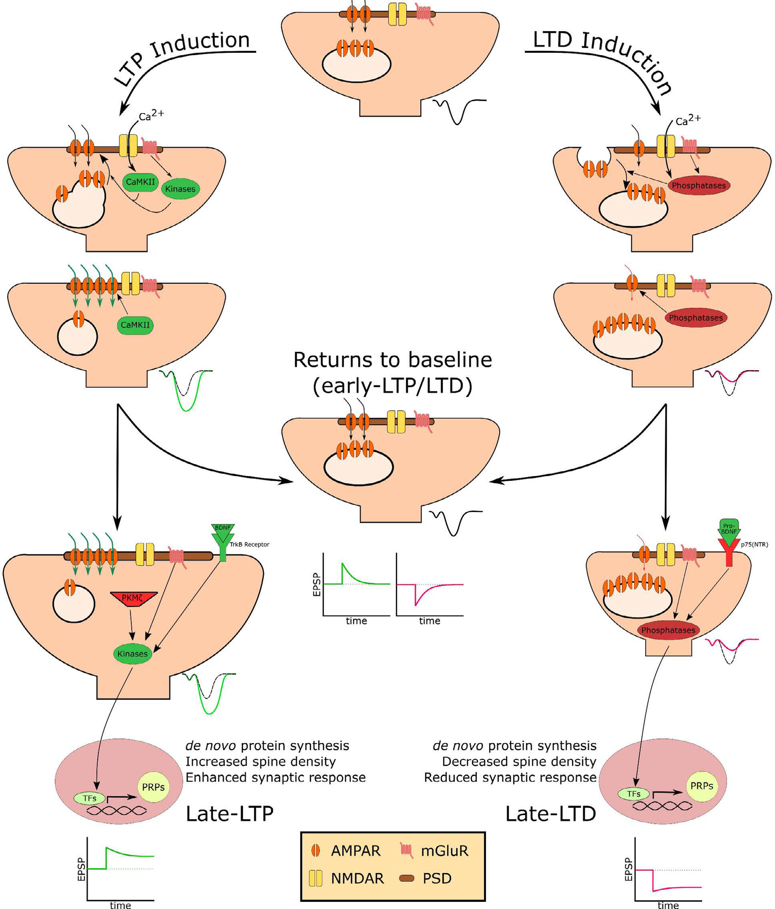

In [ ]:
display_image(images_retrieved[0].metadata['original_content'],0.4)

# RAG on Multi-Modal data

## Retrieval

In [ ]:
query = "How do LTP and LTD induction affect synaptic strength and morphology?"

In [ ]:
# query = "how is dentate gyrus related to memory consolidation"

In [ ]:
def retrieve_documents(query):
    retrieved_documents = []
    retrieved_documents = structured_hyp_retriever.invoke("Fetch at most 3 text to answer"+query)
    retrieved_documents.extend(structured_hyp_retriever.invoke("Fetch at most 2 tables to answer "+query))
    return retrieved_documents

In [ ]:
multi_modal_docs = retrieve_documents(query)

In [ ]:
retrieved_images = structured_hyp_retriever.invoke("Fetch at most 3 images for query " + query)

In [ ]:
prompt = """you are an astute research assistant. Use the information below to answer user queries.
    {multi_modal_docs}

    You must provide source and page number to answer you are providing.
    The answer you provide must come from the information provided above.
    If the information cannot help you answer the question, respond with 'i don't know the answer at the moment - it is not in my record"""

In [ ]:
response = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[{'role':'assistant','content':prompt.format(multi_modal_docs=multi_modal_docs)},
            {'role':'user','content':query}]
)


In [ ]:
print(response.choices[0].message.content)

Long-term potentiation (LTP) and long-term depression (LTD) affect synaptic strength and morphology in several ways:

1. **Synaptic Strength:**
   - **LTP** leads to the integration of AMPA receptors (AMPARs) onto the postsynaptic terminal through kinase and CaMKII activity. This process is induced by NMDAR and mGluR activity, resulting in a transient increase in excitatory postsynaptic potential (EPSP) (Source: Long‐term plasticity in the hippocampus: maintaining within and tagging between, page 4).
   - **LTD** involves the endocytosis of AMPARs from the postsynaptic terminal mediated by phosphatases induced by calcium influxes from NMDARs or mGluR signaling. This process results in a transient decrease in EPSP (Source: Long‐term plasticity in the hippocampus: maintaining within and tagging between, page 4).

2. **Morphology:**
   - During LTP, there is an increase in spine density and enhanced synaptic response, which indicates the strengthening and potential growth of synaptic conn

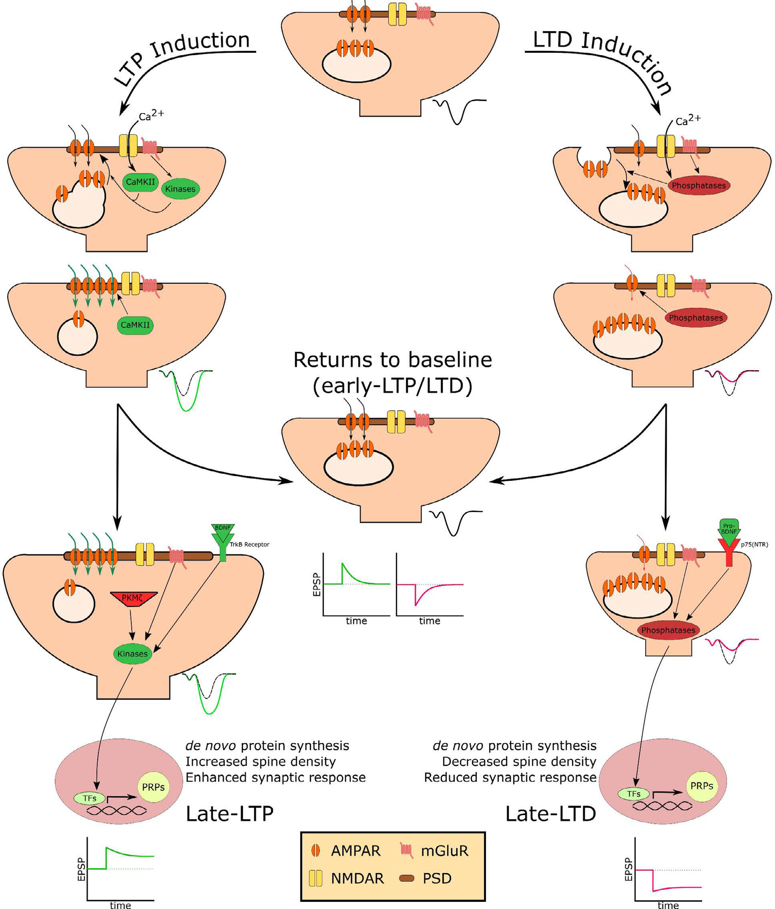

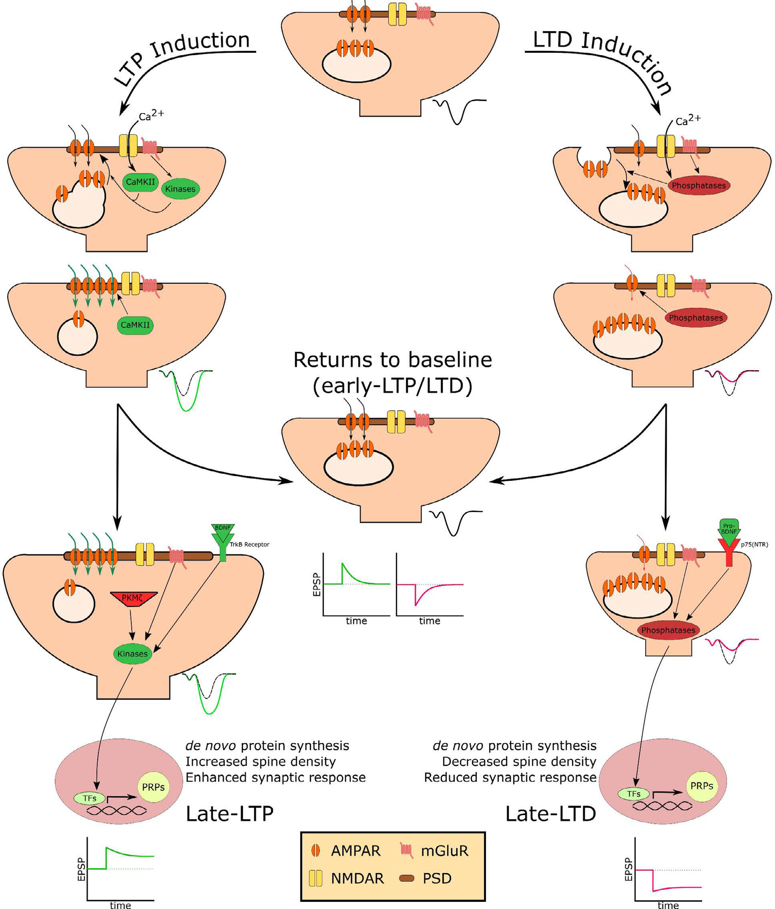

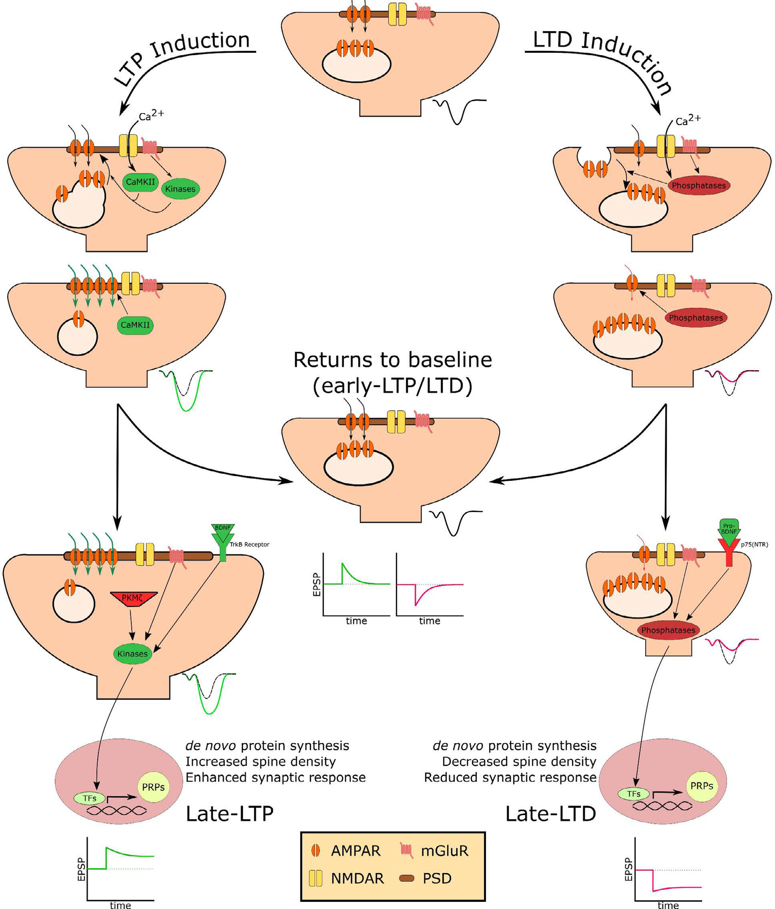

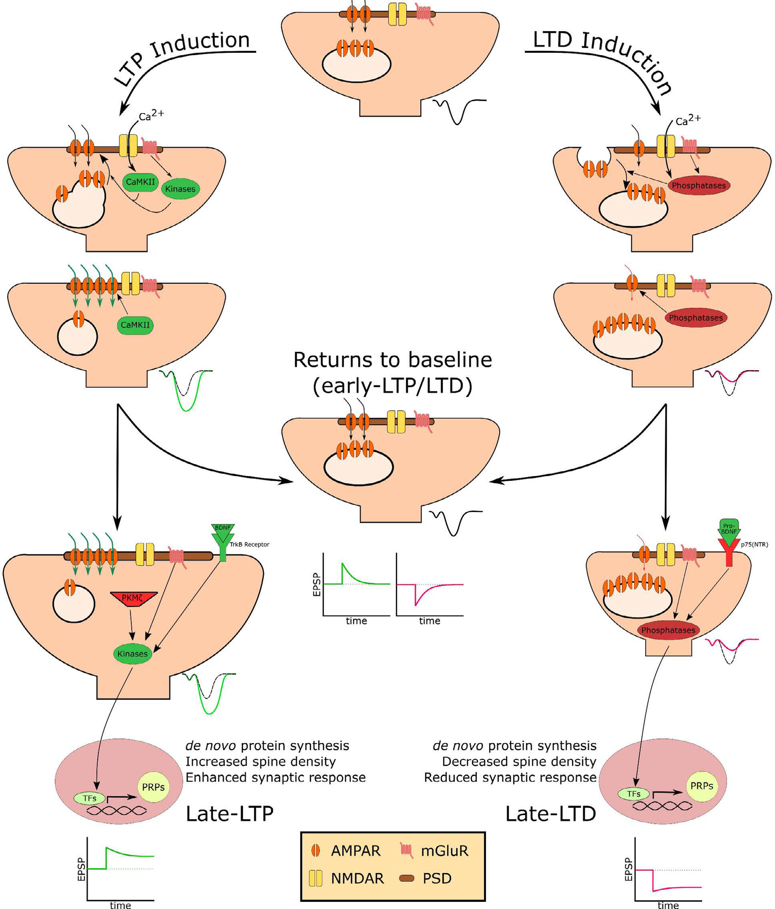

In [ ]:
for img in images_retrieved:
  display_image(img.metadata['original_content'])

## Query Expansion

In [ ]:
# Query Expansion

query_expansion_prompt = """
You are a domain expert assisting in answering questions related to research papers.
Convert the user query into something that a neuroscientist would understand. Use domain related words.
Perform query expansion on the question received. If there are multiple common ways of phrasing a user question \
or common synonyms for key words in the question, make sure to return multiple versions \
of the query with the different phrasings.

If the query has multiple parts, split them into separate simpler queries. This is the only case where you can generate more than 3 queries.

If there are acronyms or words you are not familiar with, do not try to rephrase them.

Return only 3 versions of the question as a list.
Generate only a list of questions. Do not mention anything before or after the list.

Question:
{question}
"""

In [ ]:
query_expansions = llm.invoke(query_expansion_prompt.format(question=user_input))

In [ ]:
query_expansions_list = query_expansions.content.split("\n")


In [ ]:
query_expansions_list

['[',
 '    "What are the neural substrates involved in memory processing?",',
 '    "Which brain regions are implicated in the encoding, storage, and retrieval of memory?",',
 '    "What are the components of the neural circuitry associated with memory function?"',
 ']']

In [ ]:
normal_responses = structured_hyp_retriever.invoke(user_input)

In [ ]:
context_list = []

In [ ]:
for query in query_expansions_list:
    print(query)
    retrieved = structured_hyp_retriever.invoke(query)
    context_list.extend(retrieved)
    print(retrieved)
    print("\n")




[
[Document(metadata={'original_content': 'S. (1989). Localisation in PET images: direct fitting of the intercommissural (AC-PC) line. Journal of Cerebral Blood\nFlow and Metabolism, 9, 690±695. Groen, G., Wunderlich, A. P ., Spitzer, M., Tomaczak, R., & Riepe, M. W. (2000). Brain activation during human\nnavigation: Gender-different neural networks as substrate of performance. Nature Neuroscience, 3, 404±408. Gur, R. C., Mozley, L. H., Mozley, P . D., Resnick, S. M., Karp, J. S., Alavi, A., Arnold, S. E., & Gur, R. E. (1995). Sex differences in regional cerebral glucose metabolism during a resting state.', 'page': 8, 'source': 'image_papers/Sex-Related Difference in Amygdala.pdf', 'type': 'text'}, page_content='1. How does the intercommissural (AC-PC) line fitting technique improve localization in PET imaging?\n2. What are the differences in brain activation patterns between genders during navigation tasks?\n3. Are there sex differences in regional cerebral glucose metabolism during a

In [ ]:
print_sample(context_list)

id 
 None 

metadata
{
    "original_content": "S. (1989). Localisation in PET images: direct fitting of the intercommissural (AC-PC) line. Journal of Cerebral Blood\nFlow and Metabolism, 9, 690\u00b1695. Groen, G., Wunderlich, A. P ., Spitzer, M., Tomaczak, R., & Riepe, M. W. (2000). Brain activation during human\nnavigation: Gender-different neural networks as substrate of performance. Nature Neuroscience, 3, 404\u00b1408. Gur, R. C., Mozley, L. H., Mozley, P . D., Resnick, S. M., Karp, J. S., Alavi, A., Arnold, S. E., & Gur, R. E. (1995). Sex differences in regional cerebral glucose metabolism during a resting state.",
    "page": 8,
    "source": "image_papers/Sex-Related Difference in Amygdala.pdf",
    "type": "text"
}  

Hyp Questions 
 1. How does the intercommissural (AC-PC) line fitting technique improve localization in PET imaging?
2. What are the differences in brain activation patterns between genders during navigation tasks?
3. Are there sex differences in regional cerebr

Let's put this up in a function so that we can reuse it.

In [ ]:
def retrieve_documents(query):
    retrieved_documents = []
    retrieved_documents = structured_hyp_retriever.invoke("Fetch at most 3 text to answer"+query)
    retrieved_documents.extend(structured_hyp_retriever.invoke("Fetch at most 2 tables to answer "+query))
    retrieved_documents.extend(structured_hyp_retriever.invoke("Fetch at most 2 images for query " + query))
    return retrieved_documents

In [ ]:
def expand_and_retrieve(user_input, llm=llm, structured_hyp_retriever=structured_hyp_retriever):
    # Query Expansion
    query_expansion_prompt = """
      You are a domain expert assisting in answering questions related to research papers.
    Convert the user query into something that a neuroscientist would understand. Use domain related words.
    Perform query expansion on the question received. If there are multiple common ways of phrasing a user question \
    or common synonyms for key words in the question, make sure to return multiple versions \
    of the query with the different phrasings.

    If the query has multiple parts, split them into separate simpler queries. This is the only case where you can generate more than 3 queries.

    If there are acronyms or words you are not familiar with, do not try to rephrase them.

    Return only 3 versions of the question as a list.
    Generate only a list of questions. Do not mention anything before or after the list.

    Question:
    {question}
    """

    # Get query expansions
    print("Expanding the user Query")
    query_expansions = llm.invoke(query_expansion_prompt.format(question=user_input))
    query_expansions_list = query_expansions.content.split("\n")
    print(query_expansions_list)
    # Retrieve context for each expanded query
    context_list = []
    for query in query_expansions_list:
        retrieved = retrieve_documents(query)
        context_list.extend(retrieved)

    #return only unique docs
    unique_context_dict = {doc.metadata['original_content']: doc for doc in context_list}
    unique_context_list = list(unique_context_dict.values())
    print("Unique documents retrieved")
    return unique_context_list

In [ ]:
context_list = expand_and_retrieve(query)

Expanding the user Query
["I'm sorry, it seems like your message got cut off. Could you please provide the full question or context you would like me to convert?"]
Unique documents retrieved


In [ ]:
len(context_list)

11

In [ ]:
for doc in context_list:
  print(doc.metadata['type'])

text
text
text
text
table
table
table
table
image
image
image


## Reranking

Let's get some responses to rerank

In [ ]:
normal_responses = structured_hyp_retriever.invoke(user_input)

In [ ]:
# Reranking

context_query_pairs_for_scoring = [[user_input, doc.page_content] for doc in normal_responses]

In [ ]:
crossencoder = HuggingFaceCrossEncoder(model_name="cross-encoder/ms-marco-MiniLM-L-6-v2")

/usr/local/lib/python3.11/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
crossencoder.score(context_query_pairs_for_scoring)

array([3.7323155, 1.0553895, 1.8499658, 3.1116517], dtype=float32)

Let's use this reranker to automatically rank our retrievals

In [ ]:
reranker = CrossEncoderReranker(model=crossencoder, top_n=7)

We need to create a custom retriever inheriting the baseretriever from langchain so that we can use our custom retriever for reranking.

In [ ]:
from typing import List
from langchain_core.callbacks import CallbackManagerForRetrieverRun
from langchain_core.documents import Document
from langchain_core.retrievers import BaseRetriever

class CustomRetriever(BaseRetriever):
    """A custom retriever that does query expansion and returns unique documents
    """

    def _get_relevant_documents(
        self, query: str, *, run_manager: CallbackManagerForRetrieverRun
    ) -> List[Document]:
        """Sync implementations for retriever."""
        responses = expand_and_retrieve(query, llm, structured_hyp_retriever)
        return responses


In [ ]:
reranker_retriever = ContextualCompressionRetriever(
    base_compressor=reranker, base_retriever=CustomRetriever()
)

In [ ]:
reranked_docs = reranker_retriever.invoke(user_input)

Expanding the user Query
['1. What are the neural substrates involved in memory processing?', '2. Which brain regions are implicated in the encoding, storage, and retrieval of memory?', '3. What are the anatomical structures associated with memory formation and consolidation?']
Unique documents retrieved


In [ ]:
len(reranked_docs)

7

In [ ]:
for doc in reranked_docs:
  print(doc.metadata['type'])

image
text
text
text
text
text
text


## RAG Response

Let's create some helper functions to display our images and tables in the response.

In [ ]:
import pandas as pd
from IPython.display import display
import ast

def show_table(table_str):
    # Convert the string representation of the list into an actual list
    try:
        table = ast.literal_eval(table_str)
    except (ValueError, SyntaxError) as e:
        raise ValueError("Input string is not a valid list of lists") from e

    # Ensure the input is a list of lists
    if not all(isinstance(row, list) for row in table):
        raise ValueError("Input should be a list of lists")

    # Create a DataFrame from the list of lists
    df = pd.DataFrame(table)

    # Set the first row as the column headers
    df.columns = df.iloc[0]

    # Drop the first row as it is now the header
    df = df[1:].reset_index(drop=True)

    # Display the DataFrame
    display(df)

In [ ]:
import textwrap
from IPython.display import display, Markdown

def display_wrapped_text(text, width=100):
    wrapped_text = textwrap.fill(text, width=width)
    display(Markdown(f"```\n{wrapped_text}\n```"))

In [ ]:
def get_response(query,context,tables,images):

    """
    Generates a response to a user query using context, tables, and images.

    Parameters:
    query (str): The user's query.
    context (str): The documents retrieved relevant to the query.
    tables (list): A list of table objects containing metadata and content.
    images (list): A list of image objects containing metadata and content.

    Returns:
    str: The response generated by the model.

    The function performs the following steps:
    1. Constructs a prompt using the retrieved documents.
    2. Sends the prompt and user query (text +table) to the GPT-4 model to generate a response.
    3. Displays the response.
    4. Displays any relevant images and their source.
    5. Displays any relevant tables and their source.

    If the model cannot generate a response, it prints an error message.
    If the image or table format is not supported, it prints an appropriate message.
    """

    prompt = """you are an astute research assistant. Use the information below to answer user queries.
    {docs}

    You must provide source and page number to answer you are providing.
    The answer you provide must come from the information provided above.
    If information provided is not enough to answer the query respons with 'I don't know the answer. Not in my records'"""
    print("="*100,"\n Answer: \n")
    try:

      response = client.chat.completions.create(
      model="gpt-4o-mini",
      messages=[{'role':'assistant','content':prompt.format(docs=context)},
                {'role':'user','content':query}]
      )

      display_wrapped_text(response.choices[0].message.content+ "\n"+ "="*100, width=100)

    except Exception as e:
      print(e)

    try:
      for img in images:
        display_image(img.metadata['original_content'],0.4)
        print("source: ", img.metadata['source'],"\n", img.metadata['page'])
        #print(img.page_content)
        print("="*100)
    except:
      print("Image format not supported")

    try:
      for table in tables:
        show_table(table.metadata['original_content'])
        print("source: ", table.metadata['source'],"\n", table.metadata['page'])
        #print(table.page_content)
        print("="*100)
    except:
      print("Table format not supported")
      print(table.metadata['original_content'])

    return response.choices[0].message.content



In [ ]:
def rag(query):


  reranked_docs = reranker_retriever.invoke(query)
  images_retrieved = []
  tables_retrieved = []
  context_for_llm = []


  for doc in reranked_docs:

    if doc.metadata['type'] == 'image':
      images_retrieved.append(doc)

    elif doc.metadata['type'] == 'table':
      tables_retrieved.append(doc)
      context_for_llm.append(doc.metadata) # tables and text will be used as context for the LLM

    else:
      context_for_llm.append(doc.metadata)




  get_response(query,context_for_llm,tables_retrieved,images_retrieved)



In [ ]:
query = "What are some Sex-Related Difference in Amygdala Activity during Emotionally Influenced Memory Storage"
rag(query)

Expanding the user Query
['[', '    "What are the sex-related differences in amygdala activation during emotionally modulated memory encoding?",', '    "How do sex differences affect amygdala activity during the consolidation of emotionally charged memories?",', '    "In what ways does amygdala function differ between sexes during the storage of emotion-laden memories?"', ']']
Unique documents retrieved
 Answer: 



```
The study reveals a clear sex-related difference in amygdala activity during emotionally influenced
memory storage. In men, increased activity of the right amygdala is significantly related to
enhanced recall of emotional compared to neutral films. Conversely, in women, increased activity of
the left amygdala is significantly related to enhanced recall of emotional films. This demonstrates
a gender-related lateralization of amygdala involvement in emotionally influenced memory. (Source:
Sex-Related Difference in Amygdala.pdf, pages 5-7)
====================================================================================================
```

Expanding the user Query
['[', '    "How do long-term potentiation (LTP) and long-term depression (LTD) induction modulate synaptic efficacy and structural plasticity?",', '    "In what ways do the induction of LTP and LTD influence synaptic strength and dendritic spine morphology?",', '    "What are the effects of LTP and LTD induction on synaptic transmission and the morphological changes in synapses?"', ']']
Unique documents retrieved
 Answer: 



```
LTP (Long-Term Potentiation) induction leads to the integration of AMPARs onto the postsynaptic
terminal via kinase and CaMKII activity, resulting in a transient increase in the excitatory
postsynaptic potential. This process increases the conductance of AMPARs and can lead to an enhanced
synaptic response, increased spine density, and prolonged changes in synaptic transmission through
structural and functional changes like cytoskeleton remodeling and recruitment of dendritic spines.
On the other hand, LTD (Long-Term Depression) induction involves the endocytosis of AMPARs from the
postsynaptic terminal mediated by phosphatases induced by calcium influxes. This results in a
transient decrease in the excitatory postsynaptic potential, reduced spine density, and reduced
synaptic response.  Both processes require protein synthesis for sustaining these changes, with PRPs
(plasticity-related proteins) and transcription factors being activated to maintain long-term
changes in synaptic strength and morphology.  (Source: Long‐term plasticity in the hippocampus
maintaining within and tagging between.pdf, pages 4 and 5)
====================================================================================================
```

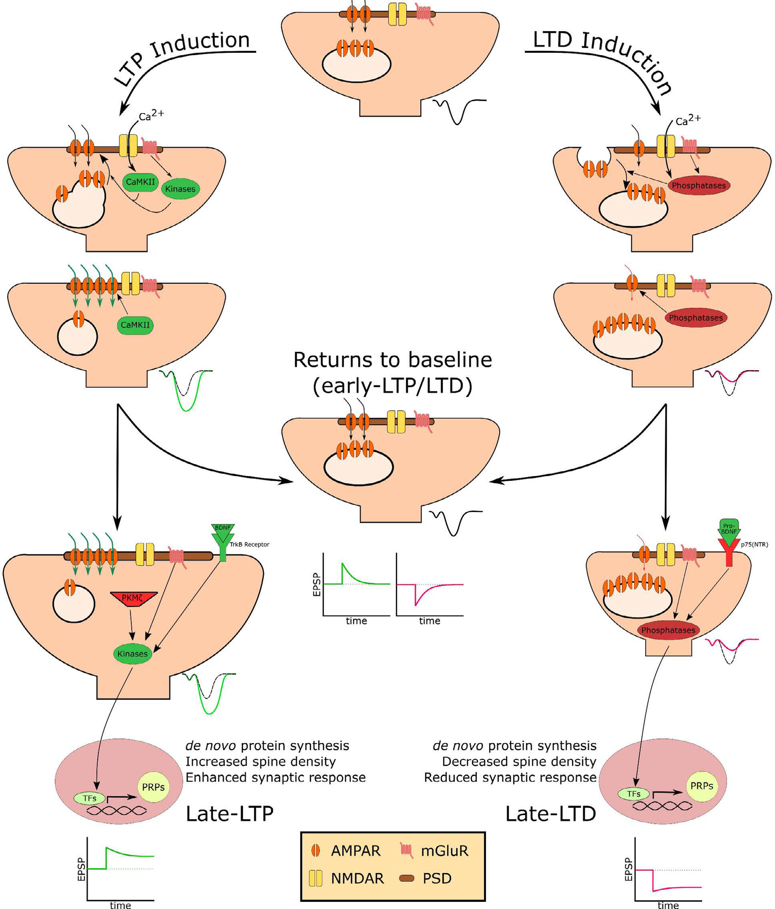

source:  image_papers/Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf 
 4


,Ca2+,MH),HA),CaMKII,Kinases
0,CaMKII,,AHAA,Phosphatases,
1,Returns to baseline,(early-LTP/LTD),,W,0D >
2,4HHH),BDNF,,Pro-,BDNF
3,TrkB Receptor,,PZS(NTR),M,PKMZ
4,#,AHHOA,,Phosphatases,
5,Kinases,,de novo protein synthesis,de novo protein synthesis,
6,Increased spine density,Decreased spine density,,PRPs,Enhanced synaptic response
7,Reduced synaptic response,PRPs,TFs,,TFs
8,Late-LTP,,Late-LTD,,
9,AMPAR,mGluR,,NMDAR,PSD


source:  Long‐term plasticity in the hippocampus  maintaining within and  tagging  between.pdf 
 4


In [ ]:
query = "How do LTP and LTD induction affect synaptic strength and morphology?"
rag(query)

In [ ]:
query = "how is dentate gyrus related to memory consolidation"
rag(query)

In [ ]:
query = "what are the different parts involved in memory consolidation?"
rag(query)

# Evaluation

## RAGAS Evaluation

RAGAs (Retrieval Augmented Generation Assessment) is a framework that evaluates Retrieval Augmented Generation (RAG) pipelines. RAGAs uses metrics to assess the performance of a RAG pipeline, including:

**Context Precision:** Measures how relevant the context is to the answer

**Context Relevancy:** Measures how relevant the context is to the question

**Context Recall:** Measures if all relevant information was retrieved to answer the question


The faithfulness_eval function improves a RAG system by verifying that each part of a generated answer can be directly inferred from the context, ensuring answer accuracy and reliability. This evaluation prevents hallucinations and reinforces user trust by confirming that the information provided aligns strictly with the retrieved content. By identifying unfaithful statements, developers can further fine-tune the model for more precise responses or the feedback can be given to the same LLM to produce even better responses.

In [ ]:
def faithfulness_eval(context, question, answer):

    # Step 1

    statement_generator_system_message = """
    Given a question, an answer, and sentences from the answer, break down each sentence in the answer into one or more fully understandable statements while also ensuring no pronouns are used in each statement.
    Format the outputs as a JSON list of statements.
    DO NOT output anything else before or after the JSON list of statements.
    """


    try:

        statement_prompt = [
        {'role': 'system', 'content': statement_generator_system_message},
        {'role': 'user', 'content': question + answer}
        ]
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=statement_prompt,
            temperature=0
        )
        statements = response.choices[0].message.content


        # Step 2
        faithfullness_system_message = """
        Your task is to judge the faithfulness of a series of statements based on a given context.
        For each statement you must return verdict as 1 if the statement can be directly inferred based on the context or 0 if the statement can not be directly inferred based on the context.

        Output Format:
        Arrange your output in the following JSON format.
        {
            "statement": statement from the list
            "explanation": <A step-by-step evaluation for faithfullness>
            "rating": integer either 1 or 0
        }
        DO NOT output anything else before or after the JSON output.
        """

        faithfullness_prompt = [
            {'role': 'system', 'content': faithfullness_system_message},
            {'role': 'user', 'content': context + question + statements}
        ]

        response = client.chat.completions.create(
            model="gpt-4o",
            messages=faithfullness_prompt,
            temperature=0
        )
        rating = response.choices[0].message.content
        print(rating)
        return rating
    except Exception as e:
        print(e)
        return None




In [ ]:
# Context Precision
def context_precision(context, question, answer):

    context_precision_system_message = """
    Given question, answer and context verify if the context was useful in arriving at the given answer.
    Give verdict as "1" if useful and "0" if not with a JSON output.

    Output Format:
    Arrange your output in the following JSON format.
    {
        "precision_explanation": <A step-by-step evaluation>
        "precision_rating": integer either 1 or 0
    }
    DO NOT output anything else before or after the JSON output.
    """

    context_precision_prompt = [
        {'role': 'system', 'content': context_precision_system_message},
        {'role': 'user', 'content': context + question + answer}
    ]

    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=context_precision_prompt,
            temperature=0
        )
        rating = response.choices[0].message.content
        print(rating)
        return rating
    except Exception as e:
        print(e)
        return None



In [ ]:
# Context Recall

def context_recall(context, question, answer):
    context_recall_system_message = """
    Given a context, and an answer, analyze each sentence in the answer and classify if the sentence can be attributed to the given context or not.
    Use only "Yes" (1) or "No" (0) as a binary classification. Output json with reason.

    Output Format:
    Arrange your output in the following JSON format.
    {
        "recall_explanation": <A step-by-step evaluation>
        "recall_rating": integer either 1 or 0
    }
    DO NOT output anything else before or after the JSON output.
    """

    context_recall_prompt = [
        {'role': 'system', 'content': context_recall_system_message},
        {'role': 'user', 'content': context + question + answer}
    ]

    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=context_recall_prompt,
            temperature=0
        )
        rating = response.choices[0].message.content
        print(rating)
        return rating
    except Exception as e:
        print(e)
        return None



In [ ]:
# Answer Relevance
def relevance(context, question, answer):
    answer_relevance_system_message = """
    Generate a question for the given answer and identify if the answer is noncommittal.
    Give noncommittal as 1 if the answer is noncommittal and 0 if the answer is committal.
    A noncommittal answer is one that is evasive, vague, or ambiguous.
    For example, "I don't know" or "I'm not sure" are noncommittal answers.

    Output Format:
    Arrange your output in the following JSON format.
    {
        "non_committal_explanation": <A step-by-step evaluation>
        "non_committal_rating": integer either 1 or 0
    }
    DO NOT output anything else before or after the JSON output.
    """

    answer_relevance_prompt = [
        {'role': 'system', 'content': answer_relevance_system_message},
        {'role': 'user', 'content': context + question + answer}
    ]

    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=answer_relevance_prompt,
            temperature=0
        )
        rating = response.choices[0].message.content
        print(rating)
        return rating
    except Exception as e:
        print(e)
        return None



In [ ]:
import re
def clean_json_output(model_output):
    """
    Cleans and extracts valid JSON from a string with potential non-JSON content.

    Args:
        model_output (str): The raw output from the model containing JSON and non-JSON text.

    Returns:
        dict: A Python dictionary parsed from the cleaned JSON string.
    """
    # Use a regular expression to extract the JSON block
    json_match = re.search(r'{.*}', model_output, re.DOTALL)
    if not json_match:
        raise ValueError("No valid JSON found in the output.")

    # Extract the matched JSON string
    json_str = json_match.group(0)

    # Clean the JSON string (e.g., remove extra spaces, line breaks if necessary)
    json_str = json_str.replace('\n', '').strip()

    # Parse and return the JSON object
    try:
        return json_str
    except json.JSONDecodeError as e:
        raise ValueError(f"Invalid JSON format: {e}")

In [ ]:
def rag_with_eval(query):
  reranked_docs = reranker_retriever.invoke(query)
  images_retrieved = []
  tables_retrieved = []
  normal_responses = []
  for doc in reranked_docs:

    if doc.metadata['type'] == 'image':
      images_retrieved.append(doc)

    elif doc.metadata['type'] == 'table':
      tables_retrieved.append(doc)
      normal_responses.append(doc.metadata)

    else:
      normal_responses.append(doc.metadata)

  print(normal_responses)

  answer = get_response(query,normal_responses,tables_retrieved,images_retrieved)
  context = str(normal_responses)
  question = query

  faithfulness_rating = faithfulness_eval(context, question, answer)
  #print(faithfulness_rating)

  context_precision_str = json.loads(clean_json_output(context_precision(context, question, answer)))
  context_recall_str = json.loads(clean_json_output(context_recall(context, question, answer)))
  relevance_str = json.loads(clean_json_output(relevance(context, question, answer)))
  combined_json = {"query": query,
                  "answer": answer,
                  **context_precision_str,
                  **context_recall_str,
                  **relevance_str,
                  "faithfulness_rating": str(faithfulness_rating)}

  df = pd.DataFrame([combined_json])
  #print(df)
  return df

In [ ]:
queries = ["what are the different parts involved in memory consolidation?","What are the different parts in hippocampus"]

Expanding the user Query
['[', '    "What are the various brain regions involved in the process of memory consolidation?",', '    "Which neural structures play a role in the consolidation of memories?",', '    "What are the different components of the brain that contribute to the process of memory consolidation?"', ']']
Unique documents retrieved
[{'original_content': 'The way in which this could be implemented via\nbackprojections to the neocortex is now considered. The modifiable connections from the CA3 neurons to the\nCA1 neurons have been suggested to allow the whole episode\nin CA3 to be produced in CA1. The CA1 neurons would then\nactivate, via their termination in the deep layers of the entorhi-\nnal cortex, at least the pyramidal cells in the deep layers of the\nentorhinal cortex (see Fig. 2). These entorhinal cortex layer 5\nneurons would then, by virtue of their backprojections\n(Lavenex and Amaral 2000; Witter et al. 2000) to the parts\nof the cerebral cortex that originall

```
Memory consolidation involves interactions between different brain regions, including the
hippocampus, which serves as an integrative center of a brain-wide network consisting of sensory and
processing regions. Within the hippocampus, the cornu ammonis subregions (CA1, CA2, CA3) and the
dentate gyrus (DG) sequentially form the trisynaptic circuit originating from the entorhinal cortex
(EC-CA2). This circuit forms the classical hippocampal loop and plays a central role in memory
consolidation. Additionally, cortical areas such as the superior temporal sulcus and inferior
temporal visual cortex are involved, and the process includes recalling previous episodic events and
building new representations in both multimodal and unimodal association cortical areas,
contributing to the consolidation of long-term memory.   Sources:  - (Long‐term plasticity in the
hippocampus maintaining within and tagging between, page 1) - (DG - CA3 - CA1, page 15)
====================================================================================================
```

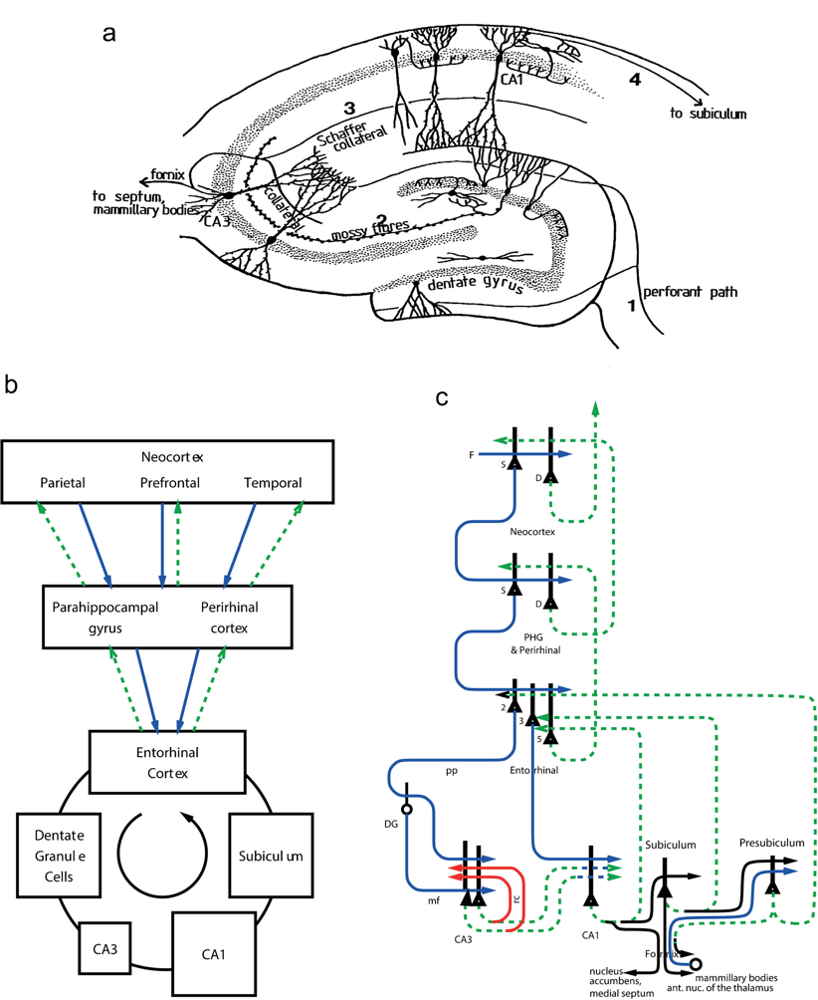

source:  image_papers/DG - CA3 - CA1.pdf 
 4


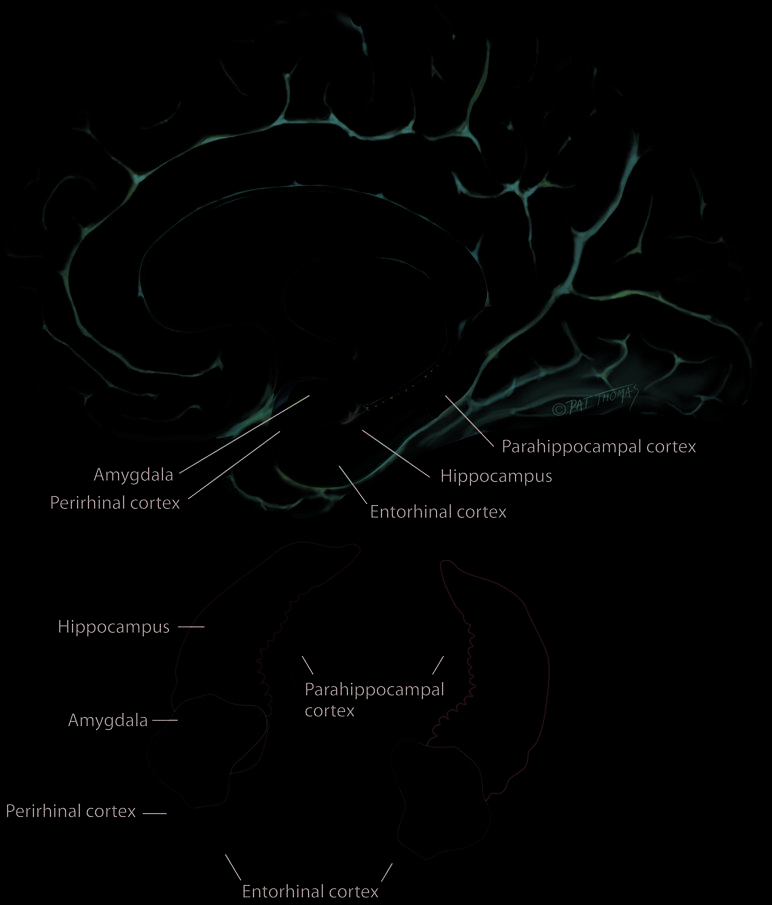

source:  image_papers/colour print - Memory the role of Medial temporal lobe.pdf 
 1
```json
{
    "statement": "Memory consolidation involves interactions between different brain regions.",
    "explanation": "The context mentions that memory consolidation can occur within a brain region or involve interactions between different brain regions. This statement is directly supported by the context.",
    "rating": 1
}
```

```json
{
    "statement": "The hippocampus serves as an integrative center of a brain-wide network.",
    "explanation": "The context states that the hippocampus serves as an integrative center of a brain-wide network consisting of sensory and processing regions. This statement is directly supported by the context.",
    "rating": 1
}
```

```json
{
    "statement": "The brain-wide network consists of sensory and processing regions.",
    "explanation": "The context explicitly mentions that the brain-wide network consists of sensory and processing regions. This statem

```
The different parts of the hippocampus mentioned in the provided information include the CA1, CA3,
and dentate gyrus. Additional connected regions include the subiculum and perforant path.    Source:
image_papers/DG - CA3 - CA1.pdf, Page 4
====================================================================================================
```

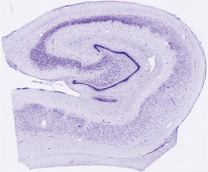

source:  image_papers/Dentate gyrus circuits for encoding, retrieval, and discrimination of episodic memories.pdf 
 2


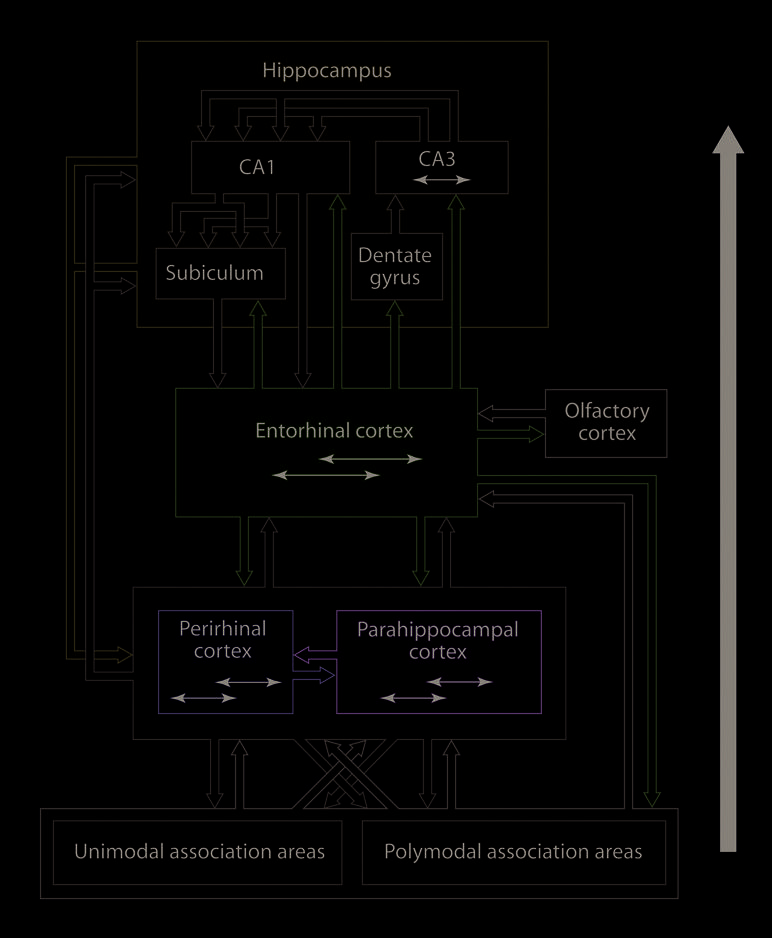

source:  image_papers/colour print - Memory the role of Medial temporal lobe.pdf 
 2


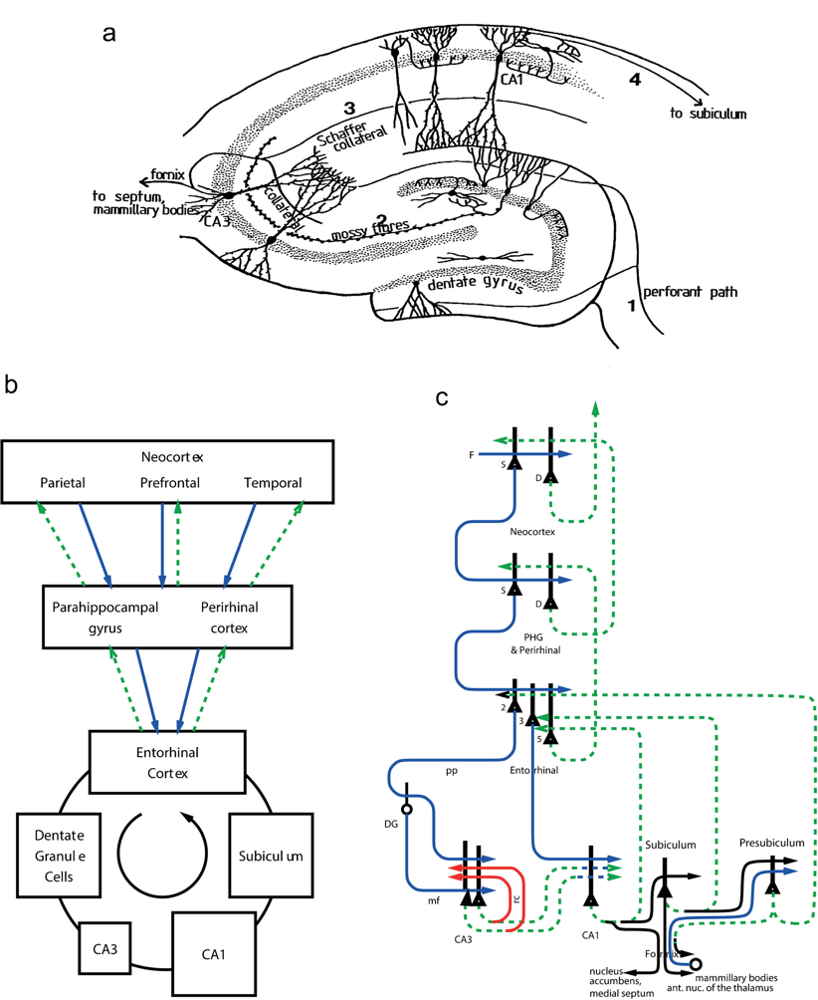

source:  image_papers/DG - CA3 - CA1.pdf 
 4


,CA1,4,to subiculum,,
0,dentate gyrus,perforant path,,,
1,Neocortex,PHG,Perirhinal,,
2,pp,Entorhinal,Subiculum,Presubiculum,
3,mf,CA3,CA1,Fo,
4,,nucleus,mammillary bodies,ant: nuc of the thalamus,medial septum


source:  DG - CA3 - CA1.pdf 
 4
{
    "statement": "The hippocampus includes the CA1 region.",
    "explanation": "The context mentions the CA1 region multiple times, indicating its role in the hippocampal system. For example, it states that 'The CA1 recodes information from CA3' and 'CA1, 4, to subiculum' in the table, confirming its inclusion in the hippocampus.",
    "rating": 1
}
{
    "statement": "The hippocampus includes the CA3 region.",
    "explanation": "The context explicitly mentions the CA3 region as part of the hippocampal system. It describes the CA3 system as operating as a single attractor network and its role in memory processes, confirming its inclusion in the hippocampus.",
    "rating": 1
}
{
    "statement": "The hippocampus includes the dentate gyrus.",
    "explanation": "The context explicitly mentions the dentate gyrus as part of the hippocampal system. It describes its role in pattern separation and its connection to CA3, confirming its inclusion in the hipp

In [ ]:
ratings = pd.DataFrame()
for query in queries:

  df = rag_with_eval(query)
  ratings = pd.concat([ratings, df], ignore_index=True)



In [ ]:
ratings

,query,answer,precision_explanation,precision_rating,recall_explanation,recall_rating,non_committal_explanation,non_committal_rating,faithfulness_rating
0,what are the different parts involved in memor...,Memory consolidation involves interactions bet...,The context provided detailed information abou...,1,[Sentence 1: 'Memory consolidation involves in...,1,The answer provides a detailed explanation of ...,0,"```json\n{\n ""statement"": ""Memory consolida..."
1,What are the different parts in hippocampus,The different parts of the hippocampus mention...,The context provides detailed information abou...,1,[The sentence 'The different parts of the hipp...,1,The answer directly lists the different parts ...,0,"{\n ""statement"": ""The hippocampus includes ..."
